## FORMULA 1 

In [174]:
import numpy as np
import scipy 
import scipy.stats
from scipy import stats
import seaborn as sns
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import itertools
from itertools import groupby
import pickle
import os
import math
from sympy import S, symbols

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.style.use('fivethirtyeight')
#sns.mpl.rcParams['figure.figsize'] = (16, 10)

# Directory to store pickled dataframes
directory = '/Users/dianaow/Documents/formula-1-race-data/dataframes/'

In [2]:
sns.set(rc={"font.style":"normal",
            "axes.facecolor":(0.9, 0.9, 0.9),
            "figure.facecolor":'white',
            "grid.color":'black',
            "grid.linestyle":':',
            "axes.grid":True,
            'axes.labelsize':30,
            'figure.figsize':(20.0, 15.0),
            'xtick.labelsize':20,
            'ytick.labelsize':20,
           })

current_palette = sns.color_palette("hls", 7)

In [3]:
def read_from_pickle(directory, filename):
    df = pd.DataFrame()
    filepath = directory + filename
    with open(filepath, 'rb') as file:
        df = pickle.load(file)
            
    return df

In [4]:
def list_all_pickle_dfs(directory):
    df_filepath = [(directory + f) for f in os.listdir(directory)]
    for a in df_filepath[1:]:
        print a

In [5]:
list_all_pickle_dfs(directory)

/Users/dianaow/Documents/formula-1-race-data/dataframes/all2016races.pickle
/Users/dianaow/Documents/formula-1-race-data/dataframes/all2016races_all_laps.pickle
/Users/dianaow/Documents/formula-1-race-data/dataframes/df_2016_tyre_use.pickle
/Users/dianaow/Documents/formula-1-race-data/dataframes/df_driver_cpd.pickle
/Users/dianaow/Documents/formula-1-race-data/dataframes/df_forecasted_time.pickle
/Users/dianaow/Documents/formula-1-race-data/dataframes/df_name_cpd.pickle
/Users/dianaow/Documents/formula-1-race-data/dataframes/df_name_cpd_stint.pickle
/Users/dianaow/Documents/formula-1-race-data/dataframes/df_statusId.pickle
/Users/dianaow/Documents/formula-1-race-data/dataframes/df_tyres.pickle
/Users/dianaow/Documents/formula-1-race-data/dataframes/df_tyres_laptimes.pickle
/Users/dianaow/Documents/formula-1-race-data/dataframes/df_tyres_nounf.pickle
/Users/dianaow/Documents/formula-1-race-data/dataframes/overtaking.pickle
/Users/dianaow/Documents/formula-1-race-data/dataframes/pitlaps.

### Read in the CSV files.
#### (CSV files are downloaded from https://www.kaggle.com/cjgdev/formula-1-race-data-19502017)

In [6]:
df_results = pd.read_csv('./formula-1-race-data/results.csv')
df_circuits = pd.read_csv('./formula-1-race-data/circuits.csv')
df_constructors = pd.read_csv('./formula-1-race-data/constructors.csv')
df_drivers = pd.read_csv('./formula-1-race-data/drivers.csv')
df_driverStandings = pd.read_csv('./formula-1-race-data/driverStandings.csv')
df_lapTimes = pd.read_csv('./formula-1-race-data/lapTimes.csv')
df_pitStops = pd.read_csv('./formula-1-race-data/pitStops.csv')
df_qualifying = pd.read_csv('./formula-1-race-data/qualifying.csv')
df_races = pd.read_csv('./formula-1-race-data/races.csv')
df_results = pd.read_csv('./formula-1-race-data/results.csv')
df_seasons = pd.read_csv('./formula-1-race-data/seasons.csv')
df_status = pd.read_csv('./formula-1-race-data/status.csv')

In [7]:
df_results.head(8)
#resultID: unique ID for each record in resultsID
#raceID: unique ID for each race 
#driverID: unique ID for each driver 
#number: drivers may have multiple numbers over the course of their careers
#constructorID: unique ID for each team entered into F1
#grid: qualifying/start position
#time: start from 1 hour. length of race starting from the time the first race has finished
#fastest lap: driver's personal fastest lap of the race
#rank: ranking of driver's personal fastest lap, amongst other drivers
#statusId: finishing status codes

,resultId,raceId,driverId,constructorId,number,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId
0,1,18,1,1,22.0,1,1.0,1,1,10.0,58,34:50.6,5690616.0,39.0,2.0,01:27.5,218.3,1
1,2,18,2,2,3.0,5,2.0,2,2,8.0,58,5.478,5696094.0,41.0,3.0,01:27.7,217.586,1
2,3,18,3,3,7.0,7,3.0,3,3,6.0,58,8.163,5698779.0,41.0,5.0,01:28.1,216.719,1
3,4,18,4,4,5.0,11,4.0,4,4,5.0,58,17.181,5707797.0,58.0,7.0,01:28.6,215.464,1
4,5,18,5,1,23.0,3,5.0,5,5,4.0,58,18.014,5708630.0,43.0,1.0,01:27.4,218.385,1
5,6,18,6,3,8.0,13,6.0,6,6,3.0,57,NaN,NaN,50.0,14.0,01:29.6,212.974,11
6,7,18,7,5,14.0,17,7.0,7,7,2.0,55,NaN,NaN,22.0,12.0,01:29.5,213.224,5
7,8,18,8,6,1.0,15,8.0,8,8,1.0,53,NaN,NaN,20.0,4.0,01:27.9,217.18,5


In [8]:
df_results_trunc = df_results[["resultId", 
                                 "raceId", 
                                 "driverId", 
                                 "constructorId",
                                 "grid",
                                 "position", 
                                 "fastestLap", 
                                 "rank",
                                 "fastestLapSpeed",
                                 "statusId"]]
df_results_trunc.head()

,resultId,raceId,driverId,constructorId,grid,position,fastestLap,rank,fastestLapSpeed,statusId
0,1,18,1,1,1,1.0,39.0,2.0,218.3,1
1,2,18,2,2,5,2.0,41.0,3.0,217.586,1
2,3,18,3,3,7,3.0,41.0,5.0,216.719,1
3,4,18,4,4,11,4.0,58.0,7.0,215.464,1
4,5,18,5,1,3,5.0,43.0,1.0,218.385,1


In [9]:
df_constructors.head(2)

,constructorId,constructorRef,name,nationality,url,Unnamed: 5
0,1,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren,NaN
1,2,bmw_sauber,BMW Sauber,German,http://en.wikipedia.org/wiki/BMW_Sauber,NaN


In [10]:
df_races = df_races[df_races['year'] < 2018]
df_races.tail(2)

,raceId,year,round,circuitId,name,date,time,url
974,987,2017,19,18,Brazilian Grand Prix,2017-11-12,16:00:00,https://en.wikipedia.org/wiki/2017_Brazilian_G...
975,988,2017,20,24,Abu Dhabi Grand Prix,2017-11-26,13:00:00,https://en.wikipedia.org/wiki/2017_Abu_Dhabi_G...


In [11]:
df_lapTimes.head()

,raceId,driverId,lap,position,time,milliseconds
0,841,20,1,1,1:38.109,98109
1,841,20,2,1,1:33.006,93006
2,841,20,3,1,1:32.713,92713
3,841,20,4,1,1:32.803,92803
4,841,20,5,1,1:32.342,92342


In [12]:
df_qualifying.head()

,qualifyId,raceId,driverId,constructorId,number,position,q1,q2,q3
0,1,18,1,1,22,1,1:26.572,1:25.187,1:26.714
1,2,18,9,2,4,2,1:26.103,1:25.315,1:26.869
2,3,18,5,1,23,3,1:25.664,1:25.452,1:27.079
3,4,18,13,6,2,4,1:25.994,1:25.691,1:27.178
4,5,18,2,2,3,5,1:25.960,1:25.518,1:27.236


In [13]:
df_drivers.head()

,driverId,driverRef,number,code,forename,surname,dob,nationality,url
0,1,hamilton,44.0,HAM,Lewis,Hamilton,07/01/1985,British,http://en.wikipedia.org/wiki/Lewis_Hamilton
1,2,heidfeld,NaN,HEI,Nick,Heidfeld,10/05/1977,German,http://en.wikipedia.org/wiki/Nick_Heidfeld
2,3,rosberg,6.0,ROS,Nico,Rosberg,27/06/1985,German,http://en.wikipedia.org/wiki/Nico_Rosberg
3,4,alonso,14.0,ALO,Fernando,Alonso,29/07/1981,Spanish,http://en.wikipedia.org/wiki/Fernando_Alonso
4,5,kovalainen,NaN,KOV,Heikki,Kovalainen,19/10/1981,Finnish,http://en.wikipedia.org/wiki/Heikki_Kovalainen


In [14]:
# Duration: Iime for a complete pit stop including the car entering and exiting the pits.
df_pitStops.head()

,raceId,driverId,stop,lap,time,duration,milliseconds
0,841,153,1,1,17:05:23,26.898,26898
1,841,30,1,1,17:05:52,25.021,25021
2,841,17,1,11,17:20:48,23.426,23426
3,841,4,1,12,17:22:34,23.251,23251
4,841,13,1,13,17:24:10,23.842,23842


In [15]:
drivers_dict = dict(zip(df_drivers.driverRef, df_drivers.driverId))

In [16]:
max_laps = pd.DataFrame()
max_laps["total laps"] = df_results.groupby("raceId").laps.max()
max_laps = max_laps.reset_index()
df_races_maxlaps = pd.merge(df_races, max_laps, on='raceId', how='left')

### RACE LAPTIMES

In [17]:
def query_raceId(year, race_name):
    """Query for race ID based on year (eg 2016) and name of race (eg "Australian Grand Prix")"""
    
    raceId = df_races[(df_races['name'] == race_name) & (df_races['year'] == year)]['raceId']
    return raceId

In [18]:
def filter_laptimes(year, race_name, driver_name):
    """Returns a dataframe filtered by year (eg 2016) and name of race (eg "Australian Grand Prix")"""

    df_race = df_races[df_races['year'].isin(year)]
    df_lapTimes_race = df_lapTimes.loc[df_lapTimes['raceId'].isin(df_race['raceId'])]
    df_M_lapTimes_race = pd.merge(df_lapTimes_race, df_race.loc[:,['name', 'raceId']], on='raceId')
    drivers_ids = df_M_lapTimes_race['driverId'].unique()
    df_drivers_year = df_drivers.loc[df_drivers['driverId'].isin(drivers_ids)]
    df_laptimes_race_drivers = pd.merge(df_M_lapTimes_race, df_drivers_year.loc[:,['driverId', 'driverRef']], on='driverId')
    
    if race_name and driver_name:
        grouped_race = df_laptimes_race_drivers.groupby("name").get_group(race_name)
        data = grouped_race.groupby("driverRef").get_group(driver_name)
    elif race_name:
        data = df_laptimes_race_drivers.groupby("name").get_group(race_name)
    elif driver_name: 
        data = df_laptimes_race_drivers.groupby("driverRef").get_group(driver_name)
    else: 
        data = df_laptimes_race_drivers
        
    return data

In [19]:
def filter_pitlaps(year, race_name, driver_name, df_pitStops = df_pitStops):
    
    df_pitStops = pd.merge(df_pitStops, df_races[['raceId', 'year', 'name']], on='raceId')

    df_race = df_pitStops[df_pitStops['year'].isin(year)]
    df_pitStops_race = df_pitStops.loc[df_pitStops['raceId'].isin(df_race['raceId'])]
    drivers_ids = df_pitStops_race['driverId'].unique()
    df_drivers_year = df_drivers.loc[df_drivers['driverId'].isin(drivers_ids)]
    df_pitStops_race_drivers = pd.merge(df_pitStops_race, df_drivers_year.loc[:,['driverId', 'driverRef']], on='driverId')
                                        
    if race_name and driver_name:
        grouped_race = df_pitStops_race_drivers.groupby("name").get_group(race_name)
        data = grouped_race.groupby("driverRef").get_group(driver_name)
    elif race_name:
        data = df_pitStops_race_drivers.groupby("name").get_group(race_name)
    elif driver_name: 
        data = df_pitStops_race_drivers.groupby("driverRef").get_group(driver_name)
    else: 
        data = df_pitStops_race 

    return data

In [20]:
def no_pitlaps(df, df_pitLaps):
    """Returns a dataframe that excludes the pit laps of each driver"""
    
    data_pitlaps_mapped = pd.merge(df, df_pitLaps[['driverId', 'stop', 'lap']], how='left',
        left_on=['driverId','lap'], right_on=['driverId','lap'])
                                            
    return data_pitlaps_mapped.loc[~data_pitlaps_mapped.index.isin(data_pitlaps_mapped.dropna(subset = ['stop']).index)].drop(['stop'], axis=1).reset_index() 

In [21]:
def filter_outliers_percentile(data, time_field='milliseconds', id_field='driverRef'):
    """Returns a logical vector corresponding to the outliers (based on percentiles) for each driver. True values are the outliers"""

    time75, time25 = np.percentile(data[time_field], [75 ,25])
    iqrtime = time75 - time25        
    timemin = time25-(iqrtime*1.5)   
    timemax = time75+(iqrtime*1.5) 

    outliers = lambda x: (
        (x < timemin) |
        (x > timemax)
    )
    
    df_outlier = data.groupby(id_field)[[time_field]].apply(outliers).rename(columns = {"milliseconds":"outlier"})
    data = pd.merge(data, df_outlier, left_index = True, right_index = True)
    data = data[data['outlier'] == False]
    data = data[data['lap'] != 1]
    
    return data

In [22]:
def filter_outliers_timediff(data, time_field='milliseconds', id_field='driverRef'):
    """Returns a logical vector corresponding to the outliers (time diff between next lap more than 1000ms) for each driver."""

    def time_diff(df):
        df['time_diff'] = df['milliseconds'].diff()
        return df
    
    data = data.groupby(id_field).apply(time_diff).reset_index()
    data['time_diff'] = abs(data['time_diff'])
    data['outlier'] = (data['time_diff'] > 1000)
    data = data[data['outlier'] == False]
    data = data[data['lap'] != 1]
        
    return data

In [23]:
def time_box_plot(data, function, time_field='milliseconds', id_field='driverRef', title = '', ylabel = 'Driver', xlabel = "Lap Time(s)"):
    """A generalized box plot that supports generic formatted dataframe with time and id fields."""

    # sort laps by finish order, where not all finish on the last lap
    def add_min(group):
        group['min_time'] = group[time_field].min()
        return group

    data_no_outliers = function(data, time_field, id_field)
    data_no_outliers = data_no_outliers.groupby(id_field).apply(add_min)
    time_order = data_no_outliers.sort_values(['min_time'])[id_field].unique()

    ids = reversed(list(time_order))
    ids = [str(item) for item in ids]

    ax = sns.boxplot(data_no_outliers[time_field], data_no_outliers[id_field], order=ids, orient='h')
    plt.title(title)
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)

    return ax


In [24]:
def laptime_chart(data, data_pitLaps, function, time_field='milliseconds', id_field='driverRef', title = '', ylabel = 'Driver', xlabel = "Lap Time(s)"):
    
    for index, driver in enumerate(data["driverRef"].unique()):
        ax = plt.figure()
        sns.pointplot(x="lap", y="milliseconds", data=data[data["driverRef"] == driver])
        ax = plt.gca()
        ax.set_title(driver)


#### Example: 2016 Australian Grand Prix

In [25]:
AUS_2016 = filter_laptimes([2016], "Australian Grand Prix", "")
AUS_2016.head()

,raceId,driverId,lap,position,time,milliseconds,name,driverRef
0,948,20,1,1,1:36.916,96916,Australian Grand Prix,vettel
1,948,20,2,1,1:31.664,91664,Australian Grand Prix,vettel
2,948,20,3,1,1:32.167,92167,Australian Grand Prix,vettel
3,948,20,4,1,1:32.014,92014,Australian Grand Prix,vettel
4,948,20,5,1,1:32.273,92273,Australian Grand Prix,vettel


/Users/dianaow/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


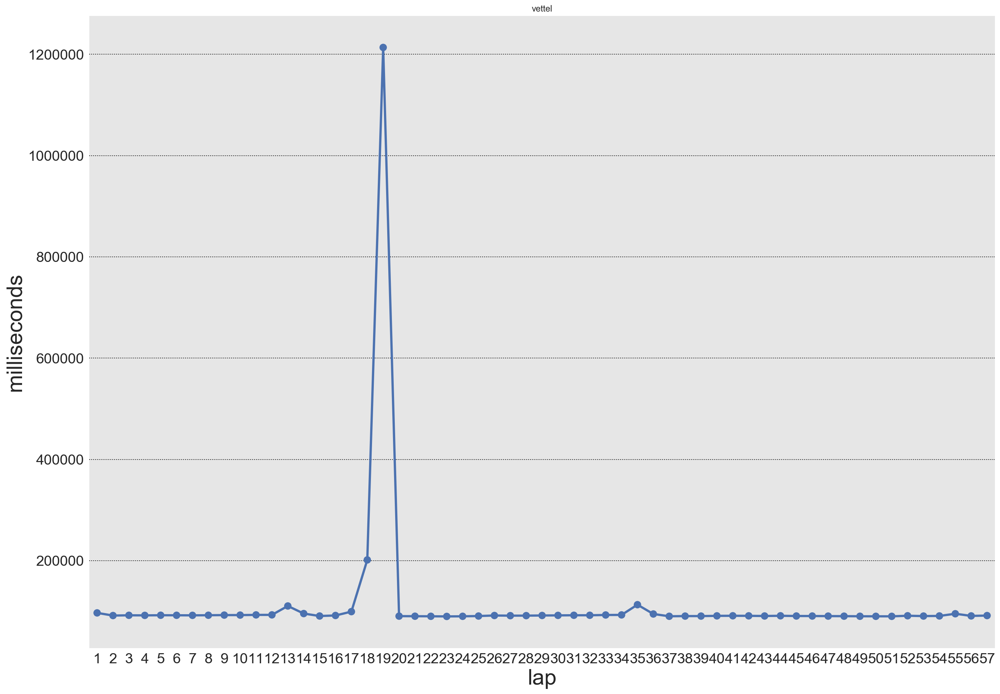

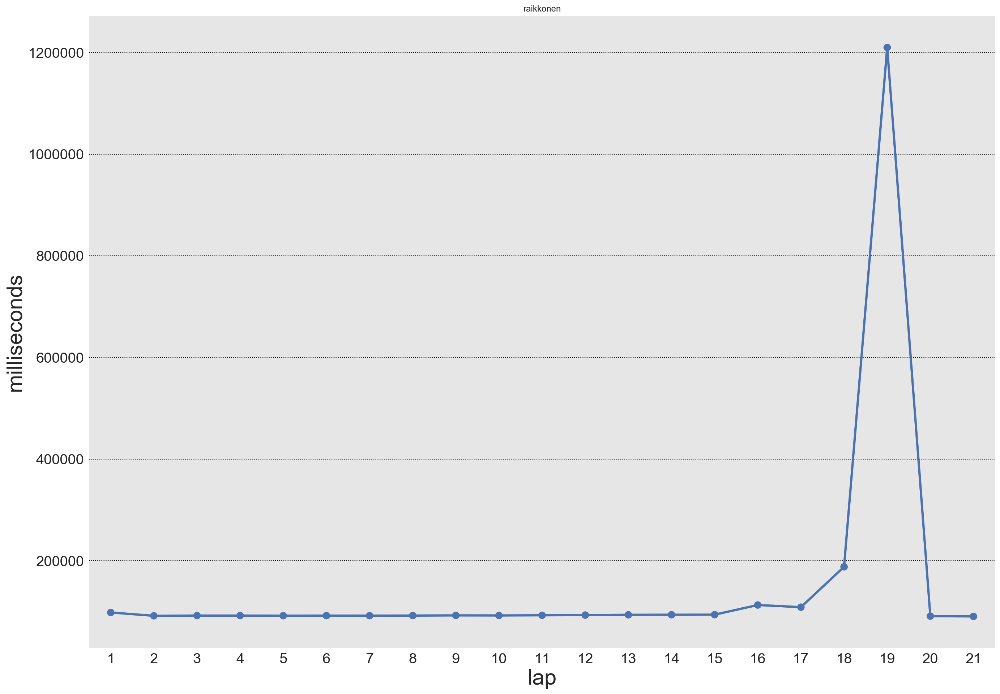

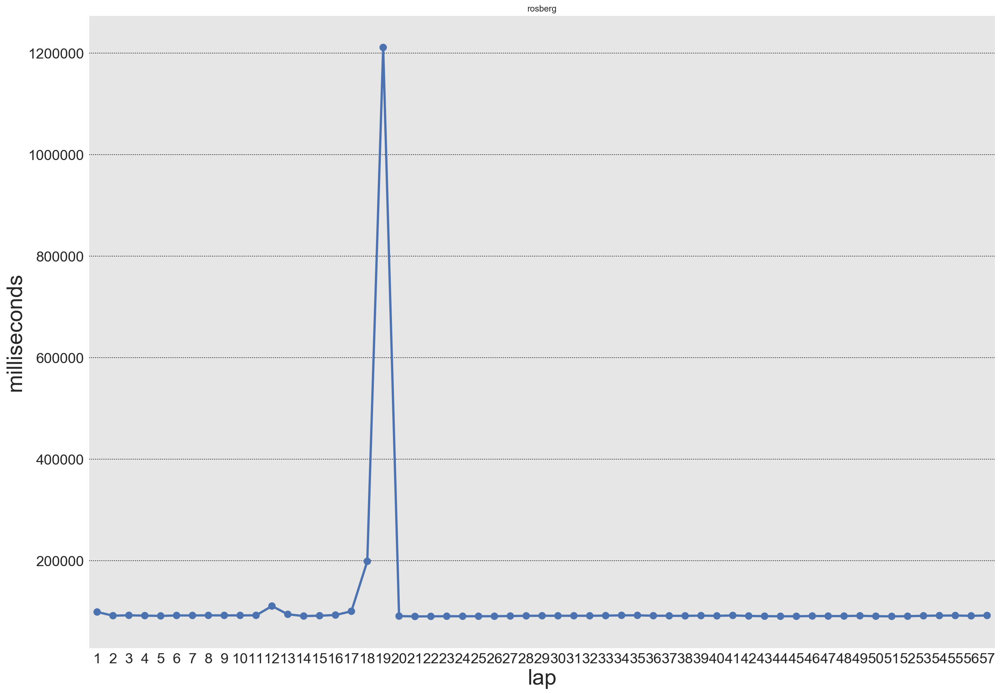

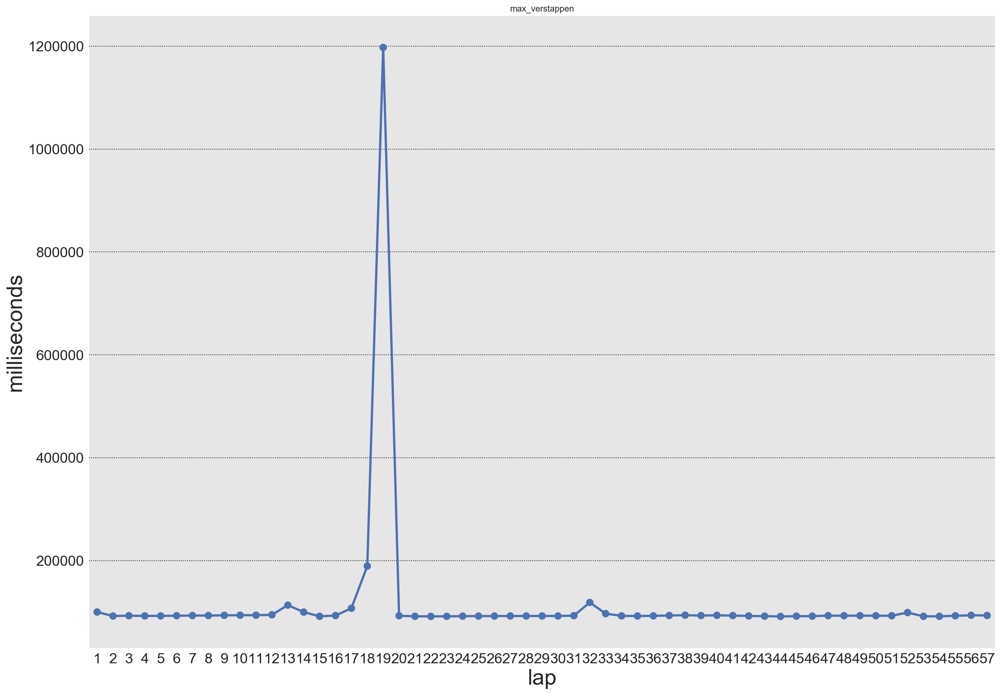

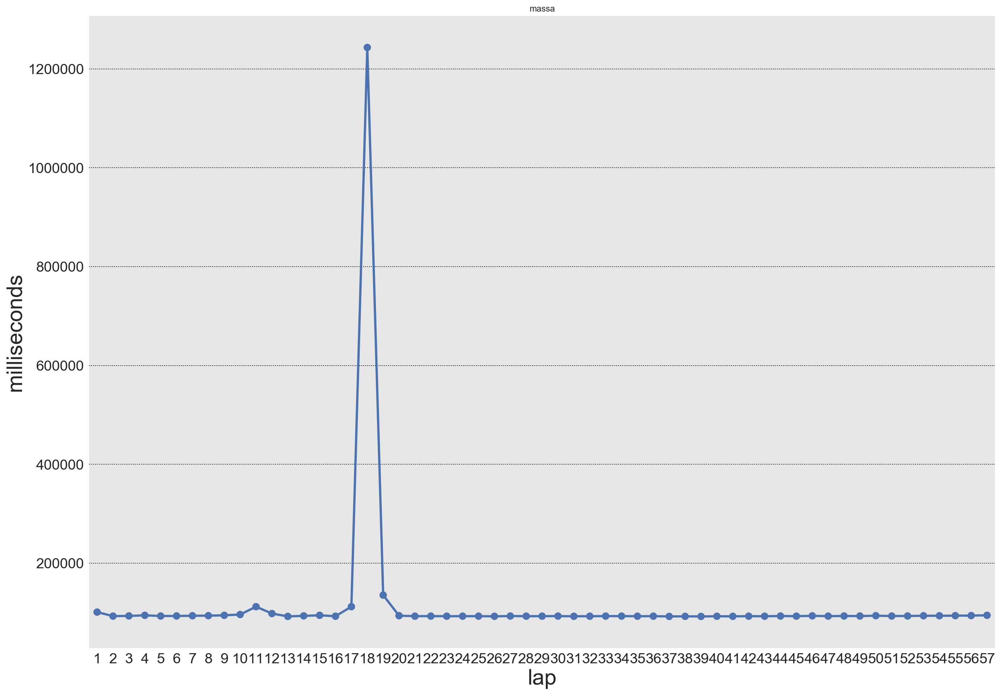

...

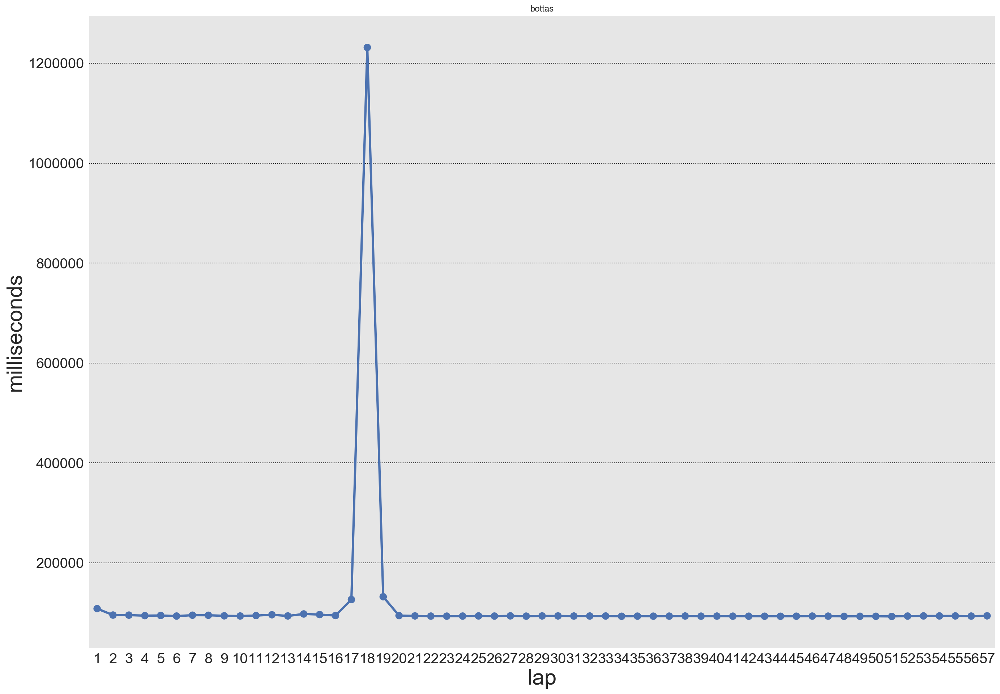

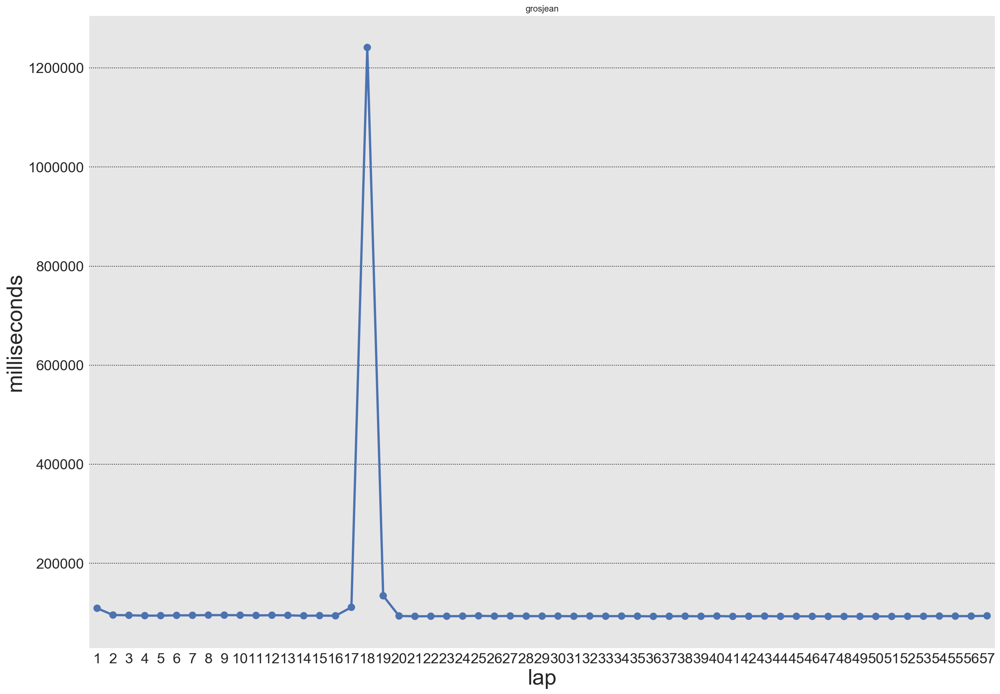

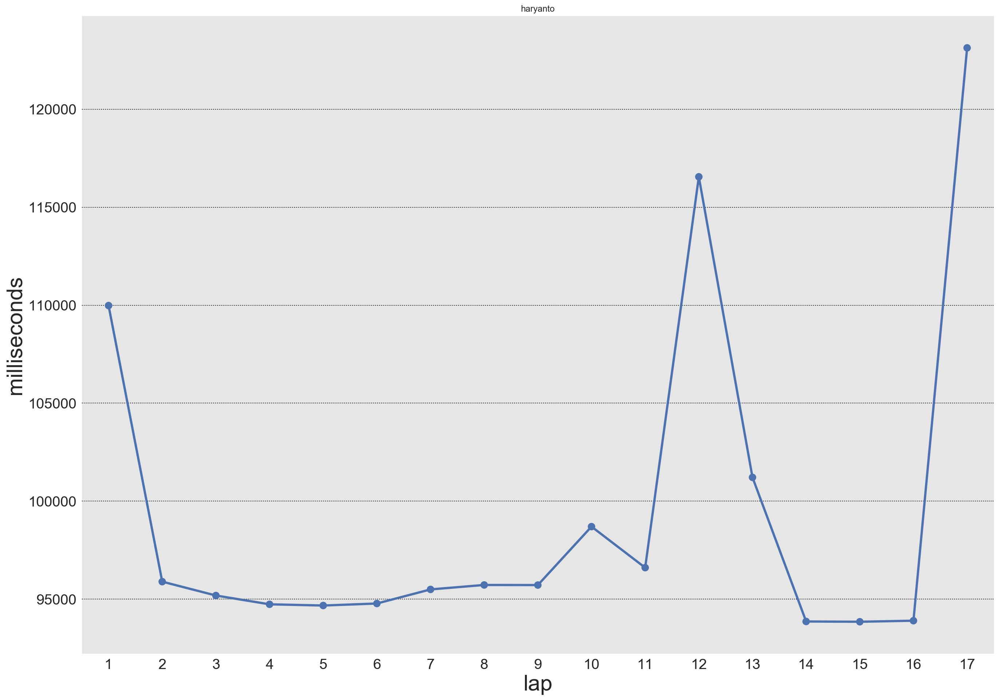

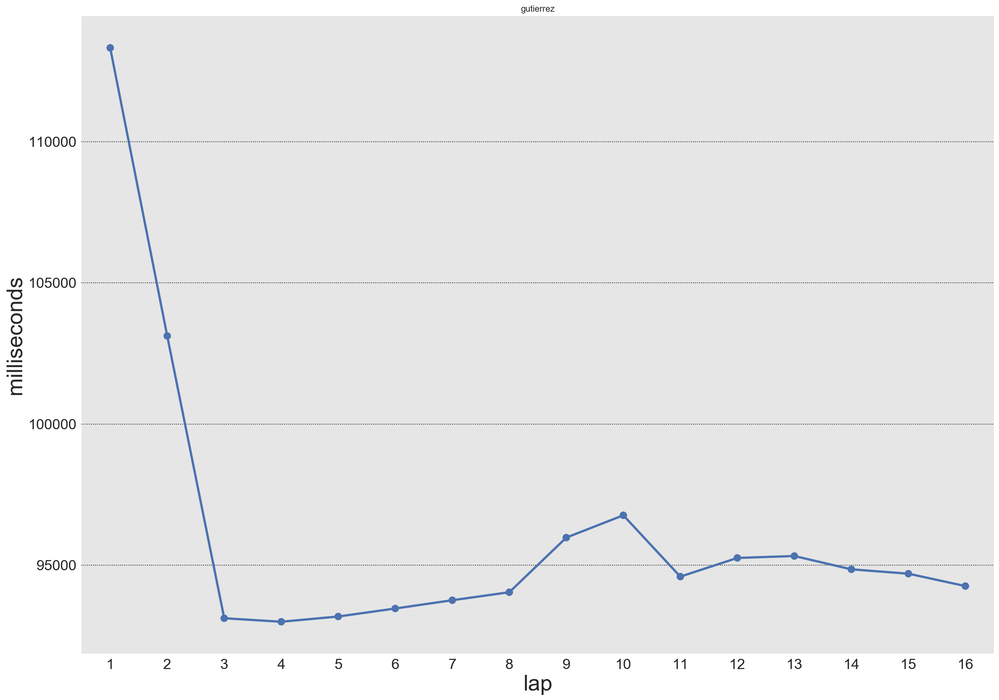

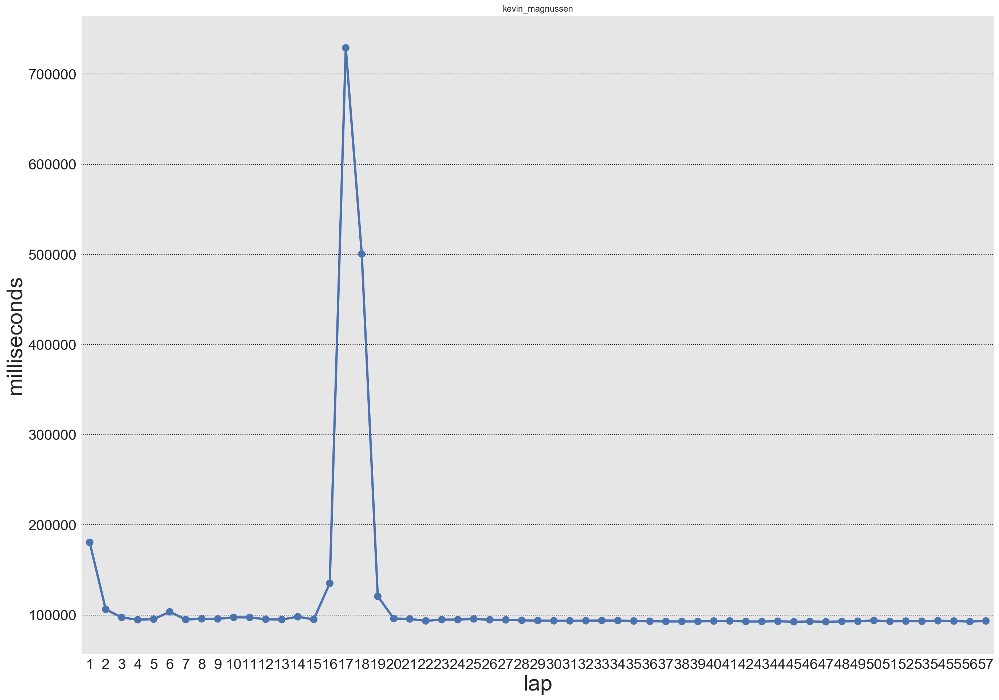

In [26]:
laptime_chart(AUS_2016, data_pitLaps="", function="", time_field='milliseconds', id_field='driverRef', title = '', ylabel = 'Lap Time(s)', xlabel = "Lap Time(s)")

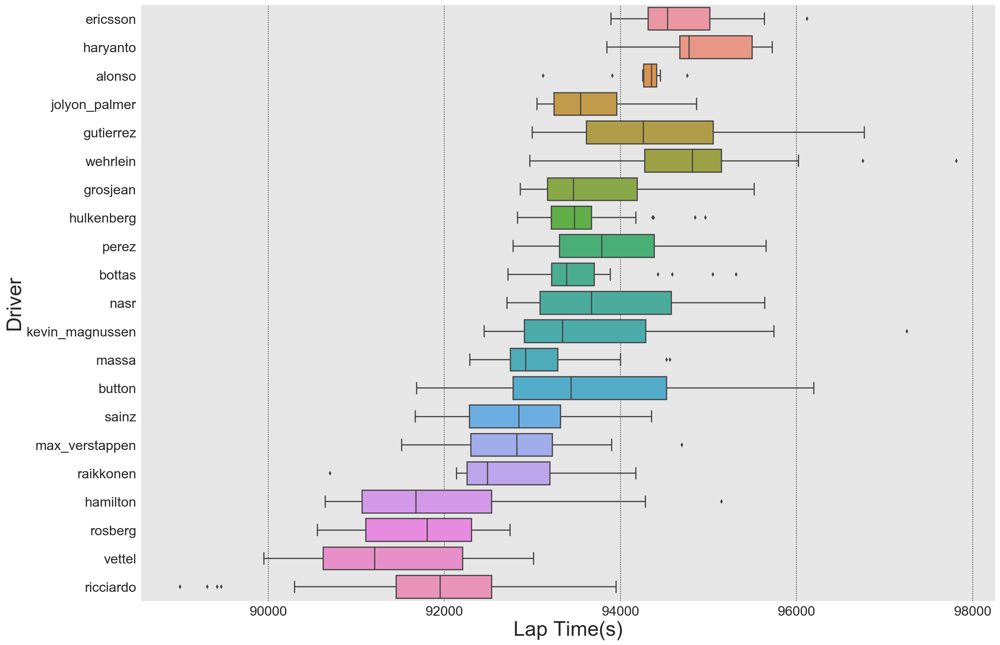

In [27]:
time_box_plot(AUS_2016, filter_outliers_timediff, time_field='milliseconds', id_field='driverRef', title = '', ylabel = 'Driver', xlabel = "Lap Time(s)")

In [28]:
data_no_outliers = filter_outliers_timediff(AUS_2016, time_field='milliseconds', id_field='driverRef')
data_no_outliers[data_no_outliers ["driverRef"] == "vettel"]

,index,raceId,driverId,lap,position,time,milliseconds,name,driverRef,time_diff,outlier
2,2,948,20,3,1,1:32.167,92167,Australian Grand Prix,vettel,503.0,False
3,3,948,20,4,1,1:32.014,92014,Australian Grand Prix,vettel,153.0,False
4,4,948,20,5,1,1:32.273,92273,Australian Grand Prix,vettel,259.0,False
5,5,948,20,6,1,1:32.204,92204,Australian Grand Prix,vettel,69.0,False
6,6,948,20,7,1,1:32.080,92080,Australian Grand Prix,vettel,124.0,False
7,7,948,20,8,1,1:32.289,92289,Australian Grand Prix,vettel,209.0,False
8,8,948,20,9,1,1:32.578,92578,Australian Grand Prix,vettel,289.0,False
9,9,948,20,10,1,1:32.571,92571,Australian Grand Prix,vettel,7.0,False
10,10,948,20,11,1,1:32.960,92960,Australian Grand Prix,vettel,389.0,False
11,11,948,20,12,1,1:33.014,93014,Australian Grand Prix,vettel,54.0,False


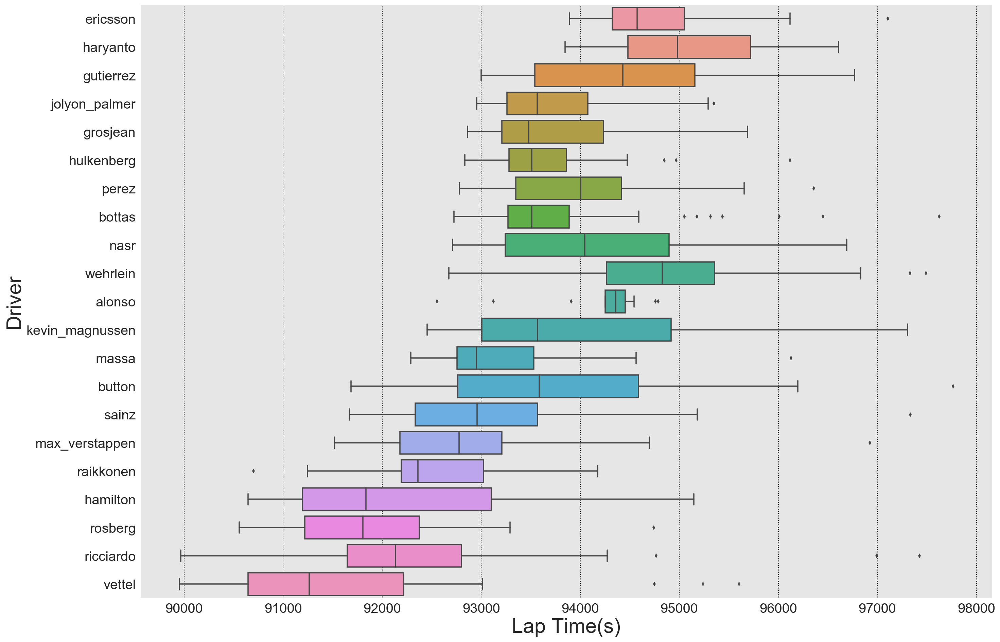

In [29]:
time_box_plot(AUS_2016, filter_outliers_percentile, time_field='milliseconds', id_field='driverRef', title = '', ylabel = 'Driver', xlabel = "Lap Time(s)")

#### Example: Vettel at the 2016 Australian Grand Prix

In [30]:
data_no_outliers = filter_outliers_percentile(AUS_2016, time_field='milliseconds', id_field='driverRef')
data_no_outliers[data_no_outliers ["driverRef"] == "vettel"]

,raceId,driverId,lap,position,time,milliseconds,name,driverRef,outlier
1,948,20,2,1,1:31.664,91664,Australian Grand Prix,vettel,False
2,948,20,3,1,1:32.167,92167,Australian Grand Prix,vettel,False
3,948,20,4,1,1:32.014,92014,Australian Grand Prix,vettel,False
4,948,20,5,1,1:32.273,92273,Australian Grand Prix,vettel,False
5,948,20,6,1,1:32.204,92204,Australian Grand Prix,vettel,False
6,948,20,7,1,1:32.080,92080,Australian Grand Prix,vettel,False
7,948,20,8,1,1:32.289,92289,Australian Grand Prix,vettel,False
8,948,20,9,1,1:32.578,92578,Australian Grand Prix,vettel,False
9,948,20,10,1,1:32.571,92571,Australian Grand Prix,vettel,False
10,948,20,11,1,1:32.960,92960,Australian Grand Prix,vettel,False


### Lap Time Variability

In [31]:
def laptime_variability(df):
    resid =  df.groupby(['driverRef', 'raceId']).agg({"milliseconds": "mean"}).rename(columns ={"milliseconds": "mean"}).reset_index()
    df_stdd = pd.merge(df, resid, on=["driverRef", "raceId"], how="left")
    df_stdd['std'] = df_stdd['milliseconds'] - df_stdd['mean']
    df_std = df_stdd.groupby(['driverRef', 'raceId'])["std"].apply(lambda x: np.std(x)).reset_index()
    #df_std = data_no_outliers.groupby(['driverRef', 'raceId'])["milliseconds"].apply(lambda x: np.std(x)).reset_index()
    return df_std

In [32]:
laptime_var = laptime_variability(data_no_outliers)
laptime_var

,driverRef,raceId,std
0,alonso,948,615.642446
1,bottas,948,940.192702
2,button,948,1287.519979
3,ericsson,948,675.097943
4,grosjean,948,818.438537
5,gutierrez,948,1085.351095
6,hamilton,948,1129.597752
7,haryanto,948,853.726972
8,hulkenberg,948,592.035459
9,jolyon_palmer,948,618.496164


#### Normalize laptime variability

In [33]:
from sklearn.preprocessing import MinMaxScaler

X = laptime_var[['std']]

mms = MinMaxScaler()
Xn = mms.fit_transform(X)
Xn_list = map(lambda x: x[0], Xn)

In [34]:
laptime_var['normalized score'] = pd.Series(Xn_list)
laptime_var

,driverRef,raceId,std,normalized score
0,alonso,948,615.642446,0.027621
1,bottas,948,940.192702,0.407349
2,button,948,1287.519979,0.813726
3,ericsson,948,675.097943,0.097184
4,grosjean,948,818.438537,0.264895
5,gutierrez,948,1085.351095,0.577186
6,hamilton,948,1129.597752,0.628955
7,haryanto,948,853.726972,0.306183
8,hulkenberg,948,592.035459,0.000000
9,jolyon_palmer,948,618.496164,0.030959


## PIT LAPS

In [149]:
pitlaps = filter_pitlaps([2016], "", "", df_pitStops = df_pitStops)
pitlaps.to_pickle(os.path.join(directory,  "pitlaps.pickle"))

In [152]:
AUS_2016_pitlaps = filter_pitlaps([2016], "Australian Grand Prix", "", df_pitStops = df_pitStops)
AUS_2016_pitlaps[AUS_2016_pitlaps["driverRef"] == "vettel"]

,raceId,driverId,stop,lap,time,duration,milliseconds,year,name,driverRef
478,948,20,1,13,16:27:17,21.339,21339,2016,Australian Grand Prix,vettel
479,948,20,2,18,16:36:56,18:09.312,1089312,2016,Australian Grand Prix,vettel
480,948,20,3,35,17:21:50,24.548,24548,2016,Australian Grand Prix,vettel


In [196]:
pitlaps_2015_2016 = filter_pitlaps([2015, 2016], "", "", df_pitStops = df_pitStops)
pitlaps_2015 = filter_pitlaps([2015], "", "", df_pitStops = df_pitStops)
pitlaps_2016 = filter_pitlaps([2016], "", "", df_pitStops = df_pitStops)

In [210]:
from collections import Counter

def pit_strategy_trends(df):
    
    most_common_value = []
    most_frequency = []
    second_most_common_value = []
    second_frequency = []

    names = df.name.unique()
    years = df.year.unique()[0]
    
    for name in names:
        unique_pitlaps = list(df.groupby('name').get_group(name)['lap'])
        ctr = Counter(unique_pitlaps)
        most, most_freq = ctr.most_common(1)[0]
        second_most, second_freq = ctr.most_common(2)[1]
        most_common_value.append(most)
        most_frequency.append(most_freq)
        second_most_common_value.append(second_most)
        second_frequency.append(second_freq)

    stat = pd.DataFrame({"name": names,
                         "year": years,
                         "mode": most_common_value,
                         "mode freq": most_frequency,
                         "mode next": second_most_common_value,
                         "mode next freq": second_frequency })
    
    return stat.sort_values("name", ascending=True)

In [217]:
pitlaps_mode_2015 = pit_strategy_trends(pitlaps_2015)
pitlaps_mode_2016 = pit_strategy_trends(pitlaps_2016)
pitlaps_mode = pd.concat([pitlaps_mode_2015, pitlaps_mode_2016])
pitlaps_name = pd.DataFrame(pitlaps_2015_2016.groupby(["name", "year"])['stop'].agg(lambda x: stats.mode(x)[0][0]).reset_index())
pitlaps_trend = pd.merge(pitlaps_mode, pitlaps_name, on=['name', 'year'], how='left')
pitlaps_trend

,mode,mode freq,mode next,mode next freq,name,year,stop
0,21,2,24,2,Australian Grand Prix,2015,1
1,4,9,34,3,Malaysian Grand Prix,2015,1
2,14,5,12,3,Chinese Grand Prix,2015,1
3,10,4,14,3,Bahrain Grand Prix,2015,1
4,14,4,15,4,Spanish Grand Prix,2015,1
5,36,3,64,3,Monaco Grand Prix,2015,1
6,27,3,28,3,Canadian Grand Prix,2015,1
7,34,2,45,2,Austrian Grand Prix,2015,1
8,44,7,20,4,British Grand Prix,2015,1
9,45,17,44,11,Hungarian Grand Prix,2015,1


In [173]:
pitlaps_driver = pd.DataFrame(pitlaps_2015_2016.groupby(["driverId", "name", "year"])['stop'].max().reset_index())
pitlaps_driver

,driverId,name,year,stop
0,1,Abu Dhabi Grand Prix,2015,2
1,1,Abu Dhabi Grand Prix,2016,2
2,1,Australian Grand Prix,2015,1
3,1,Australian Grand Prix,2016,2
4,1,Austrian Grand Prix,2015,1
5,1,Austrian Grand Prix,2016,4
6,1,Bahrain Grand Prix,2015,2
7,1,Bahrain Grand Prix,2016,3
8,1,Belgian Grand Prix,2015,2
9,1,Belgian Grand Prix,2016,3


## OVERTAKING

In [72]:
df_overtaking = read_from_pickle(directory, "overtaking.pickle")
df_overtaking.head()

,0,1,2,3,4,5,6,7,8,name,year
0,4.0,5.0,Lewis Hamilton,3.0,12,0.0,Felipe Massa,3.0,7,Australian Grand Prix,2016
1,5.0,8.0,Daniel Ricciardo,4.0,7,0.0,Nico Hülkenberg,4.0,11,Australian Grand Prix,2016
2,5.0,16.0,Valtteri Bottas,4.0,12,0.0,Felipe Nasr,4.0,5,Australian Grand Prix,2016
3,9.0,14.0,Valtteri Bottas,8.0,8,0.0,Marcus Ericsson,8.0,2,Australian Grand Prix,2016
4,10.0,6.0,Daniel Ricciardo,9.0,2,0.0,Felipe Massa,9.0,1,Australian Grand Prix,2016


In [73]:
# Since Pit: Full laps since the overtaking driver pitted or started the race
# Until Pit: Full laps until the overtaking driver next pitted or finished the race
# Pit Diff: Difference in number of laps since each driver has pitted or started
# Since Pit: Full laps since the overtaken driver pitted or started the race
# Until Pit: Full laps until the overtaken driver next pitted or finished the race

def overtaking_preprocessing(df):
    
    df = df.rename(columns={ 0:'lap', 1:'position', 2:'overtaker', 3:'overtaker: since pit', 4:'overtaker: until pit', \
                                                   5:'pit diff', 6:'overtaken', 7:'overtaken: since pit', 8:'overtaken: until pit'})

    df['lap'] = df['lap'].astype(int)
    
    df_overtaken = df.loc[:,["lap","position","overtaker","overtaker: since pit","overtaker: until pit","name","year"]]
    df_overtaker = df.loc[:,["lap","position","overtaken","overtaken: since pit","overtaken: until pit","name","year"]]
    df_new = pd.concat([df_overtaken, df_overtaker])
    
    df_new["clear lap?"] = ["overtaken" if pd.isnull(row['overtaker']) else "overtaker" for index,row in df_new.iterrows()]
    df_new['overtaken'] = df_new['overtaken'].fillna(df_new['overtaker'])
    df_new['overtaken: since pit'] = df_new['overtaken: since pit'].fillna(df_new['overtaker: since pit'])
    df_new['overtaken: until pit'] = df_new['overtaken: until pit'].fillna(df_new['overtaker: until pit'])
    df_new = df_new.rename(columns={ "overtaken" :'driverRef', "overtaken: since pit": "since pit", 'overtaken: until pit': "until pit"})
    
    df_new['driverRef'] = df_new['driverRef'].str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8')
    df_new['driverRef'] = [row.split(' ', 1 )[1].lower() for row in df_new['driverRef']]
    df_new['driverId'] = df_new['driverRef'].map(drivers_dict)
    df_new['year'] = pd.to_numeric(df_new['year'], errors='coerce')
    df_new = df_new.drop(['overtaker', 'overtaker: since pit', 'overtaker: until pit'], axis=1)
    
    df_new = pd.merge(df_new, df_races[['raceId','name', 'year']], on=['name', 'year'], how="left")
    
    return df_new

In [74]:
df_overtaking_preprocessed = overtaking_preprocessing(df_overtaking)
df_overtaking_preprocessed 

,lap,name,driverRef,since pit,until pit,position,year,clear lap?,driverId,raceId
0,4,Australian Grand Prix,hamilton,3.0,12,5.0,2016,overtaker,1,948
1,5,Australian Grand Prix,ricciardo,4.0,7,8.0,2016,overtaker,817,948
2,5,Australian Grand Prix,bottas,4.0,12,16.0,2016,overtaker,822,948
3,9,Australian Grand Prix,bottas,8.0,8,14.0,2016,overtaker,822,948
4,10,Australian Grand Prix,ricciardo,9.0,2,6.0,2016,overtaker,817,948
5,10,Australian Grand Prix,bottas,9.0,7,13.0,2016,overtaker,822,948
6,10,Australian Grand Prix,grosjean,9.0,8,16.0,2016,overtaker,154,948
7,10,Australian Grand Prix,sainz,1.0,8,19.0,2016,overtaker,832,948
8,10,Australian Grand Prix,sainz,1.0,8,18.0,2016,overtaker,832,948
9,10,Australian Grand Prix,gutierrez,9.0,Unknown,19.0,2016,overtaker,821,948


## RACE PACE

In [133]:
df_race_pace = read_from_pickle(directory, "df_forecasted_time.pickle")
df_race_pace

,driverRef,milliseconds
0,alonso,99863.952381
1,bottas,92765.977011
2,button,98109.217391
3,ericsson,95007.911765
4,grosjean,99124.956522
5,gutierrez,91879.642857
6,hamilton,94826.827160
7,haryanto,95180.923077
8,hulkenberg,93594.679612
9,kvyat,89790.258065


## TYRE USE

- https://www.formula1.com/en/championship/inside-f1/rules-regs/tyres-and-wheels.html

In [75]:
import pandas as pd
xl = pd.ExcelFile("./formula-1-race-data/F1_Tyre_Data.xlsx")
xl.sheet_names
tyres = xl.parse("Sheet2")

In [76]:
#{"Ultrasoft": "#9b59b6", purple},
#{"Supersoft": "#ff5745", red},
#{"Soft": "#edee3d", yellow},
#{"Medium": "#ffffff", white},
#{"Hard":"#ff9932", orange},
#{"Intermediate":"#00f164", green},
#{"Wet":"#85c8fb", blue}

palette = {"Ultra soft":"#9b59b6", 
           "Super soft":"#ff5745", 
           "Soft":"#edee3d", 
           "Medium":"#cccccc", 
           "Hard":"#ff9932",
           "Intermediate":"#00f164",
           "Wet":"#85c8fb"}

tyres_dict = {"Ultra soft": "option", 
              "Super soft": "option", 
              "Soft": "option", 
              "Medium": "prime",
              "Hard": "prime",
              "Wet": "option",
              "Intermediate" : "option",
              "Used Supersoft": "option", 
              "Used Soft": "option", 
             }

In [430]:
def tyre_use_race(df, year, race_name, driver_name):
    
    df = df.iloc[:, 0:12]
    df.columns = [x.lower() for x in df.columns]
    df_race = df_races[df_races['year'].isin(year)]
    df_lapTimes_race = df_lapTimes.loc[df_lapTimes['raceId'].isin(df_race['raceId'])]
    df["driverRef"] = [row.split(' ', 1 )[1].lower() for row in df['driver']]
    df = df.rename(columns = {'race': 'name'})
    
    if race_name and driver_name:
        grouped_race = df.groupby("name").get_group(race_name)
        data = grouped_race.groupby("driverRef").get_group(driver_name)
    elif race_name:
        data = df.groupby("name").get_group(race_name)
    elif driver_name: 
        data = df.groupby("driverRef").get_group(driver_name)
    else: 
        data = df
    
    df = pd.merge(df, df_races[["year", "name", "raceId"]], left_on=['year', 'name'], right_on=['year', 'name'])
    df = pd.merge(df, df_drivers[['driverRef', 'driverId']], left_on=['driverRef'], right_on=['driverRef'])
    df = df.rename(columns={'stint': 'stint 1', 'stint.1': 'stint 2', 'stint.2': 'stint 3', 'stint.3': 'stint 4'})
    df.drop('driver', axis=1, inplace=True)
        
    return df

In [423]:
df_tyres = tyre_use_race(tyres, [""], "", "")
df_tyres.to_pickle(os.path.join(directory,  "df_tyres.pickle"))

In [432]:
def tyre_trends(df):
    
    all_stat = pd.DataFrame()
    names = df.name.unique()
    sets = ['first set', 'second set', 'third set', 'fourth set']
    
    for name in names:
        for s in sets:
            unique_pitlaps = list(df.groupby('name').get_group(name)[s])
            ctr = Counter(unique_pitlaps)
            most, most_freq = ctr.most_common(1)[0]

            stat = pd.DataFrame({"name": name,
                                 "set": s,
                                 "mode": most,
                                 "mode freq": most_freq}, index=[0])
        
            all_stat = pd.concat([all_stat, stat])
    
    # MAP TYRE COMPOUND TYPE
    all_stat['compound'] = all_stat['mode'].map(tyres_dict)

    return all_stat

In [433]:
df_tyres_2016 = tyre_use_race(tyres, ["2016"], "", "")
tyre_combinations = tyre_trends(df_tyres_2016)
tyre_combinations

,mode,mode freq,name,set,compound
0,Ultra soft,16,Mexican Grand Prix,first set,option
0,Medium,18,Mexican Grand Prix,second set,prime
0,NaN,29,Mexican Grand Prix,third set,NaN
0,NaN,40,Mexican Grand Prix,fourth set,NaN
0,Super soft,15,United States Grand Prix,first set,option
0,Soft,27,United States Grand Prix,second set,option
0,NaN,18,United States Grand Prix,third set,NaN
0,NaN,36,United States Grand Prix,fourth set,NaN
0,Soft,20,Japanese Grand Prix,first set,option
0,Hard,17,Japanese Grand Prix,second set,prime


In [411]:
def no_unfinished_stints(df, df_statusId):
    
    df = pd.merge(df, df_statusId, on=["raceId", "driverId"], how='left')
    df = df[df["stop"].notnull()]
    for i, row in df.iterrows():
        X = "unfinished"
        if row['statusId'] != 1.:
            if row['stop'] == 3.:
                df.loc[i, 'stint 4']=np.nan
                df.loc[i, 'fourth set']= np.nan
            elif row['stop'] == 2.:
                df.loc[i, 'stint 3']=np.nan
                df.loc[i, 'third set']= np.nan
            elif row['stop'] == 1.:
                df.loc[i, 'stint 2']=np.nan
                df.loc[i, 'second set']= np.nan 
            elif row['stop'] == 0.:
                df.loc[i, 'stint 1']=np.nan
                df.loc[i, 'first set']= np.nan
    
    return df

In [87]:
df_statusId = read_from_pickle(directory, "df_statusId.pickle")
df_tyres_nounf = no_unfinished_stints(df_tyres, df_statusId)
df_tyres_nounf.to_pickle(os.path.join(directory,  "df_tyres_nounf.pickle"))

In [88]:
def tyre_use_race_laptimes(df, df_tyres):
    
    df = pd.merge(df, df_tyres, on=['raceId', 'driverId', 'name', 'driverRef'])
    
    df['stint 1+2'] = df['stint 1'] + df['stint 2']
    df['stint 1+2+3'] = df['stint 1'] + df['stint 2'] + df['stint 3']
    df['stint 1+2+3+4'] = df['stint 1'] + df['stint 2'] + df['stint 3'] + df['stint 4']
    
    df['tyre'] = np.where((df['lap'] <= df['stint 1']), df['first set'], np.nan)
    df['tyre2'] = np.where((df['lap'] > df['stint 1']) & (df['lap'] <= df['stint 1+2']), df['second set'], np.nan)
    df['tyre3'] = np.where((df['lap'] > df['stint 1+2']) & (df['lap'] <= df['stint 1+2+3']), df['third set'], np.nan)
    df['tyre4'] = np.where((df['lap'] > df['stint 1+2+3']) & (df['lap'] <= df['stint 1+2+3+4']), df['fourth set'], np.nan)
    
    df['tyre'].fillna(df['tyre2'], inplace=True)
    df['tyre'].fillna(df['tyre3'], inplace=True)
    df['tyre'].fillna(df['tyre4'], inplace=True)
    
    df['stint'] = np.where((df['lap'] <= df['stint 1']), 1, np.nan)
    df['stint2'] = np.where((df['lap'] > df['stint 1']) & (df['lap'] <= df['stint 1+2']), 2, np.nan)
    df['stint3'] = np.where((df['lap'] > df['stint 1+2']) & (df['lap'] <= df['stint 1+2+3']), 3, np.nan)
    df['stint4'] = np.where((df['lap'] > df['stint 1+2+3']) & (df['lap'] <= df['stint 1+2+3+4']), 4, np.nan)
    
    df['stint'].fillna(df['stint2'], inplace=True)
    df['stint'].fillna(df['stint3'], inplace=True)
    df['stint'].fillna(df['stint4'], inplace=True)

    df.drop(['stint2', 'stint3', 'stint4', 'stint 1', 'stint 2', 'stint 3', 'stint 4', 'stint 1+2', 'stint 1+2+3', 'stint 1+2+3+4', 'tyre2', 'tyre3', 'tyre4', 'session', 'first set', 'second set', 'third set', 'fourth set'], axis=1, inplace=True)

    return df

In [89]:
df_all = filter_laptimes(["2016"], "", "")
data_no_outliers = filter_outliers_timediff(df_all, time_field='milliseconds', id_field='driverRef')
df_tyres_laptimes = tyre_use_race_laptimes(data_no_outliers, df_tyres_nounf)
df_tyres_laptimes.to_pickle(os.path.join(directory,  "df_tyres_laptimes.pickle"))

In [90]:
def master_table(df, df_pitLaps, df_overtaking):
    
    # MERGE PITLAPS DATAFRAME
    df_pitLaps = df_pitLaps.drop(['duration'], axis=1)
    df_pitLaps = df_pitLaps.rename(columns = {'milliseconds': 'duration'})
    cols_to_use = df_pitLaps.columns.difference(df.columns)
    df_pitLaps = pd.concat([df_pitLaps[cols_to_use], df_pitLaps[['raceId', 'driverId','lap']]], axis=1)
    df = pd.merge(df, df_pitLaps, on=['raceId', 'driverId','lap'], how='left')
    
    # INSERT QUALIFYING POSITION
    df_qualifying.rename(columns = {'position': 'qual position'}, inplace=True)
    df = pd.merge(df, df_qualifying[['raceId', 'driverId', 'qual position']], on=['raceId', 'driverId'])
    
    # MERGE OVERTAKING DATAFRAME
    df_overtaking_dropped = df_overtaking.drop(['driverRef', 'position', 'name', 'year'] , axis=1)
    df = pd.merge(df, df_overtaking_dropped, on=['raceId', 'driverId','lap'], how='left')
    
    # MAP TYRE COMPOUND TYPE
    df['compound'] = df['tyre'].map(tyres_dict)
    
    return df

In [92]:
def line_plot_tyre_use(df):
    
    for index, driver in enumerate(df["driverRef"].unique()):
        ax = plt.figure()
        p = sns.lmplot(x="lap", y="milliseconds", data=df[df["driverRef"] == driver], hue="tyre", palette=palette, size=20, truncate=True)
        leg = p.axes[0, 0].get_legend()
        ax = plt.gca()
        ax.set_title(driver)


## Tyre Degradation Model

- I will test with either a linear or polynomial regression model
- Hypothesis:
    - U-curve: A crossover point occurs for the option tyre, where it becomes slower than a fresh prime tyre. 
    - A driver who switches to fresh prime tyres at this point may be able to undercut a competitor who stays out longer on options.
- From the tyre degradation function, I include a tyre degradation multiplier. For example, Perez has run 1.08 times longer than the average driver overall. I therefore divided his degradation rate by a factor of 1.08.
- LapTime = ForecastedPrimeTime + Random (add back the std dev) + TyreDeg

### Let's filter laps which drivers ran in clean air only to analyze tyre degradation per stint per tyre type
1) Filter laps of race leaders only
2) Filter laps where the driver is behind the driver in front by more than 1.2s

In [96]:
def tyre_degradation_per_stint(tyres, year, race_name, driver, tyre_group, tyre, center=False, minimum=5):

    #df[df['clear lap?'].isnull()]
    
    df = filter_laptimes(year, race_name, driver)
    df_no_outliers = filter_outliers_percentile(df)
    df_tyres = tyre_use_race(tyres, year, race_name, driver)
    nounfstints = no_unfinished_stints(df_tyres, df_statusId)
    df_new = tyre_use_race_laptimes(df_no_outliers, nounfstints)

    # Filter laps of race leaders only
    df_new = df_new[df_new['position'] == 1]
    
    # MAP TYRE COMPOUND TYPE
    df_new['compound'] = df_new['tyre'].map(tyres_dict)
    
    # Center laptimes to baseline
    if center == True:
        df_race_pace.rename(columns={"milliseconds": "est race pace"}, inplace=True)
        df_new = pd.merge(df_new, df_race_pace, on='driverRef')
        df_new['milliseconds_ctr'] = df_new["milliseconds"] - df_new['est race pace']
    
    # A stint must be more than 5 laps to be included in model
    if minimum:
        df_new = df_new.groupby(['name','driverRef','stint']).filter(lambda x: len(x) >= minimum)
        
    # Specify tyre to measure from
    if tyre:
        grouped = df_new.groupby(tyre_group).get_group(tyre).reset_index()        
        return grouped
    else:
        return df_new

In [94]:
def plot_tyre_degration(df, groupby, hue, palette):

    for index, g in enumerate(df[groupby].unique()):
        ax = plt.figure()
        p = sns.lmplot(x="lap", y="milliseconds", data=df[df[groupby] == g], hue=hue, palette=palette, size=20, fit_reg=False)
        leg = p.axes[0, 0].get_legend()
        ax = plt.gca()
        ax.set_title(g)


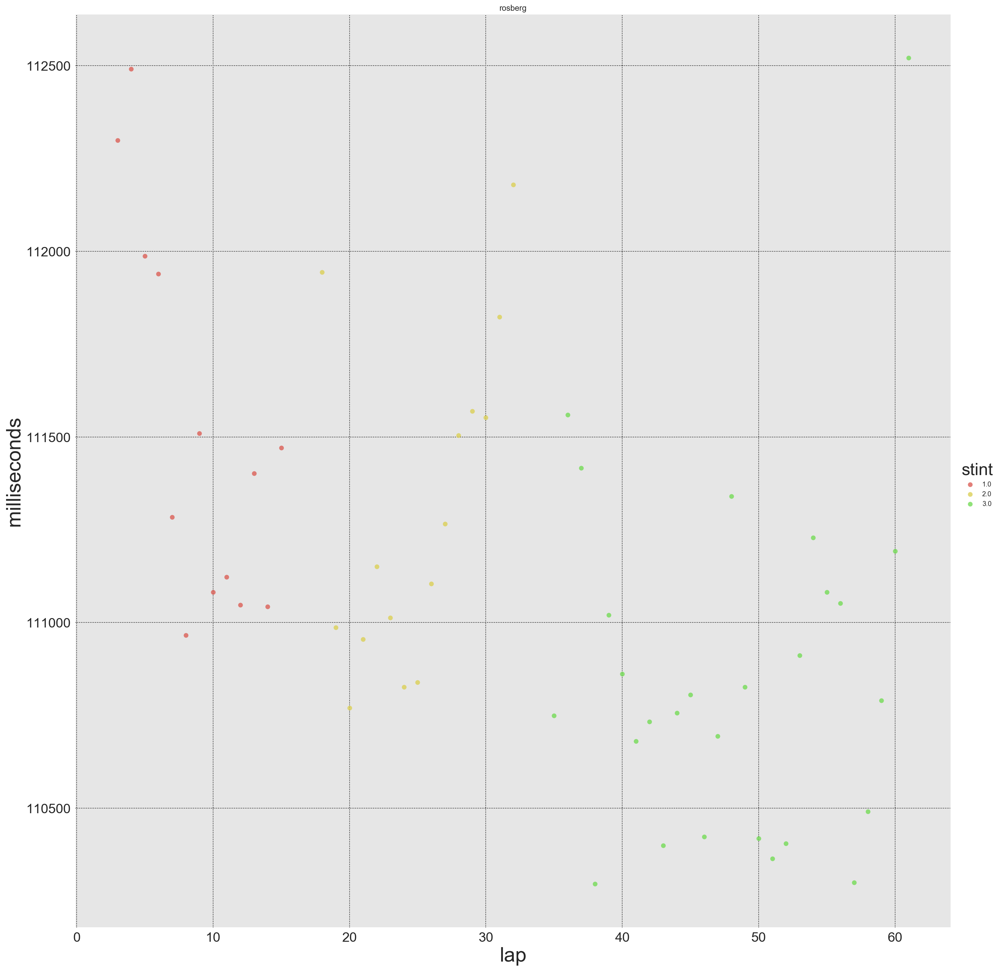

In [97]:
df_2016_SGP_TDPS = tyre_degradation_per_stint(tyres, ['2016'], "Singapore Grand Prix", "","", "")
plot_tyre_degration(df_2016_SGP_TDPS, "driverRef", "stint", current_palette)

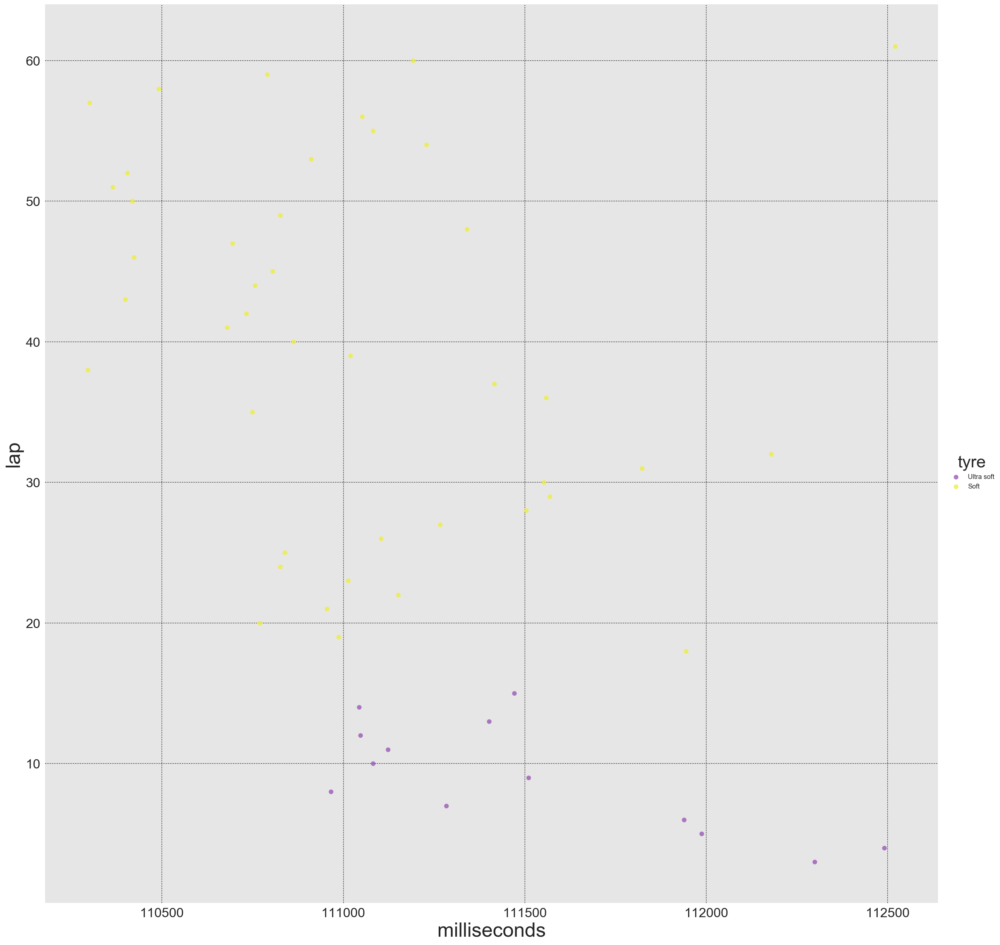

In [134]:
lm = sns.lmplot(x='milliseconds', y='lap', data=df_2016_SGP_TDPS, hue="tyre", size=20, palette=palette, fit_reg=False)

#### Polynomial Regression

In [99]:
def indiv_polynomial_reg_POLYFIT(data, groupby_1_field, groupby_2_field, groupby_3_field, centered=False, show_plot=False, show_table=True):
    """Returns individual polynomial regression coefficients for each driver in each race"""
    
    coeffs = []
    intercepts = []
    combination = []
    g1s = []
    g2s = []
    g3s = []
    all_eqns = pd.DataFrame()
    
    groupby_1 = data[groupby_1_field].unique()
    groupby_2 = data[groupby_2_field].unique()
    groupby_3 = data[groupby_3_field].unique()
        
    for g1, g2, g3 in itertools.product(groupby_1, groupby_2, groupby_3):
        
        try:
            data_grouped = data.groupby([groupby_1_field, groupby_2_field, groupby_3_field]).get_group((g1, g2, g3)).reset_index()
            f = plot_polyreg_curve_1(data_grouped, centered, show_plot)
            coeffs.append(f)
            g1s.append(g1) 
            g2s.append(g2)
            g3s.append(g3)
   
        except: 
            #comment = "Did not run a full stint on this tyre during the season"
            comment = "No group"
            coeffs.append(comment) 
            g1s.append(g1) 
            g2s.append(g2)
            g3s.append(g3)

    model = pd.DataFrame(
                            { groupby_1_field: g1s,
                              groupby_2_field: g2s,
                              groupby_3_field: g3s,
                             'coeffs': coeffs,
                            }
                        )
    if show_table == True:
        return model

In [100]:
def plot_polyreg_curve_1(group, centered=True, show_plot=True):
    
    # get x and y vectors
    x = group['lap']

    if centered == True:
        y = group['milliseconds_ctr']
    else:
        y = group['milliseconds']

    # calculate polynomial
    z = np.polyfit(x, y, 2)
    f = np.poly1d(z)

    # calculate new x's and y's
    x_new = range(group['lap'].min(), group['lap'].max() +1)
    y_new = f(x_new)
            
    if show_plot == True:
        
        plt.figure(figsize=(20,10))
        plt.title("  Race: " + str(group['name'].unique()[0]) + \
                  "  Driver: " + str(group['driverRef'].unique()) + \
                  "  Stint: " + str(group['stint'].unique()[0]) + \
                  "  Compound: " + str(group['compound'].unique()[0]) + \
                  "  Tyre: " + str(group['tyre'].unique()[0]))
        plt.plot(x, y,'o', x_new, y_new)
        plt.show()

    return f


### Derive tyre degradation multiplier for each driver

In [101]:
def calculate_tyre_degration_multipler(df, df_statusId, groupby_field):
    
    no_unfinished_stints(df, df_statusId)
        
    firstset = df.groupby([groupby_field, "first set"])["stint 1"].agg(['mean']).reset_index()
    firstset["stint"] = 1
    secondset = df.groupby([groupby_field, "second set"])["stint 2"].agg(['mean']).reset_index()
    secondset["stint"] = 2
    thirdset = df.groupby([groupby_field, "third set"])["stint 3"].agg(['mean']).reset_index()
    thirdset["stint"] = 3
    fourthset = df.groupby([groupby_field, "fourth set"])["stint 4"].agg(['mean']).reset_index()
    fourthset["stint"] = 4
    
    df = pd.concat([firstset, secondset, thirdset, fourthset])
    
    df['first set'].fillna(df['second set'], inplace=True)
    df['first set'].fillna(df['third set'], inplace=True)
    df['first set'].fillna(df['fourth set'], inplace=True)
    
    df = df.drop(['second set', 'third set', 'fourth set'], axis=1).rename(columns={"first set": "tyre"})    
    df['compound'] = df['tyre'].map(tyres_dict)
                
    return df

In [108]:
def stint_table(df, groupby_field_1, groupby_field_2, groupby_field_3):
    
    if groupby_field_3 != "":
        df_new = df.groupby([groupby_field_1, groupby_field_2, groupby_field_3])["mean"].agg(['mean']).reset_index()
    else:
        df_new = df.groupby([groupby_field_1, groupby_field_2])["mean"].agg(['mean']).reset_index()
    
    # calculate overall average and ratio
    df_overall = df.groupby(groupby_field_1)["mean"].agg(['mean']).reset_index()
    df_new['ratio'] = df_new["mean"] / df_overall['mean']
    
    # merge total number of laps per circuit and calculate ratio
    if groupby_field_1 == "name":
        maxlaps = df_races_maxlaps[df_races_maxlaps['year'] == 2016]
        df_new = pd.merge(df_new, maxlaps[['name', 'total laps']], on='name', how='left')
        df_new['ratio: stint/total laps'] =  df_new['mean'] / df_new['total laps']
    
    return df_new

In [167]:
df_name_cpd = stint_table(calculate_tyre_degration_multipler(df_tyres, df_statusId, 'name'), 'name', 'compound', 'stint')
df_name_cpd_new = pd.merge(df_name_cpd, pitlaps_mode, on='name', how='left')
df_name_cpd_new

,name,compound,stint,mean,ratio,total laps,ratio: stint/total laps,mode,mode freq,mode next,mode next freq
0,Abu Dhabi Grand Prix,option,1,16.945370,0.897165,55.0,0.308098,8.0,6.0,7.0,5.0
1,Abu Dhabi Grand Prix,option,2,24.991285,1.191162,55.0,0.454387,8.0,6.0,7.0,5.0
2,Abu Dhabi Grand Prix,option,3,16.651515,0.653989,55.0,0.302755,8.0,6.0,7.0,5.0
3,Abu Dhabi Grand Prix,option,4,16.000000,1.368640,55.0,0.290909,8.0,6.0,7.0,5.0
4,Australian Grand Prix,option,1,15.384921,0.903978,57.0,0.269911,18.0,17.0,12.0,5.0
5,Australian Grand Prix,option,2,22.842105,1.840171,57.0,0.400739,18.0,17.0,12.0,5.0
6,Australian Grand Prix,option,3,14.000000,1.161027,57.0,0.245614,18.0,17.0,12.0,5.0
7,Australian Grand Prix,option,4,15.000000,0.971096,57.0,0.263158,18.0,17.0,12.0,5.0
8,Australian Grand Prix,prime,2,40.400000,1.485313,57.0,0.708772,18.0,17.0,12.0,5.0
9,Australian Grand Prix,prime,3,35.666667,2.596423,57.0,0.625731,18.0,17.0,12.0,5.0


In [110]:
df_driver_cpd = stint_table(calculate_tyre_degration_multipler(df_tyres, df_statusId, 'driverRef'), 'driverRef', 'compound', '')
df_driver_cpd

,driverRef,compound,mean,ratio
0,alonso,option,19.894421,1.032524
1,alonso,prime,17.805556,0.852285
2,bottas,option,18.582645,1.065926
3,bottas,prime,28.280000,1.563686
4,button,option,14.316667,0.586749
5,button,prime,26.160000,0.951273
6,ericsson,option,14.905025,0.721072
7,ericsson,prime,26.566667,1.449530
8,gasly,option,24.400000,1.142517
9,giovinazzi,option,27.500000,1.145833


In [ ]:
# Pickle tyre stint table dataframe
df_name_cpd_stint.to_pickle(os.path.join(directory, "df_name_cpd_stint.pickle"))
df_driver_cpd.to_pickle(os.path.join(directory, "df_driver_cpd.pickle"))

### Create tyre degradation model for each tyre compound/type per race

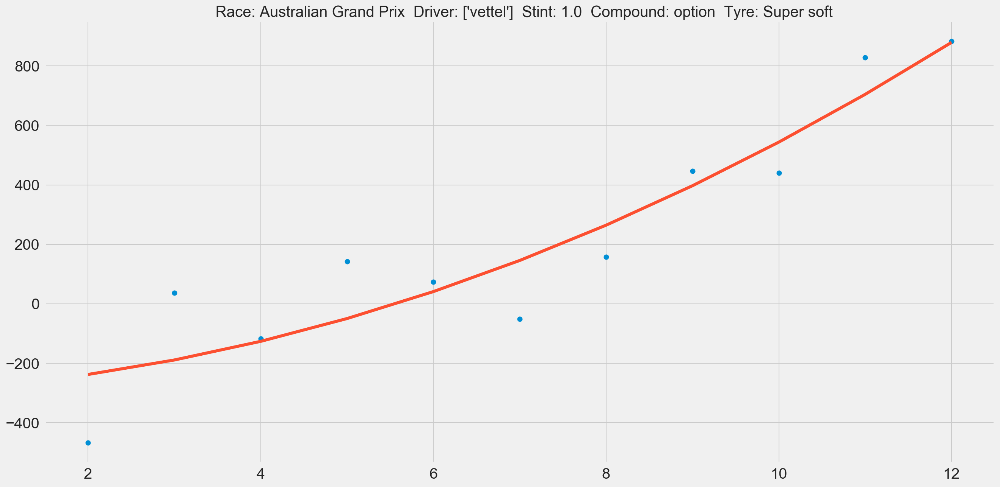

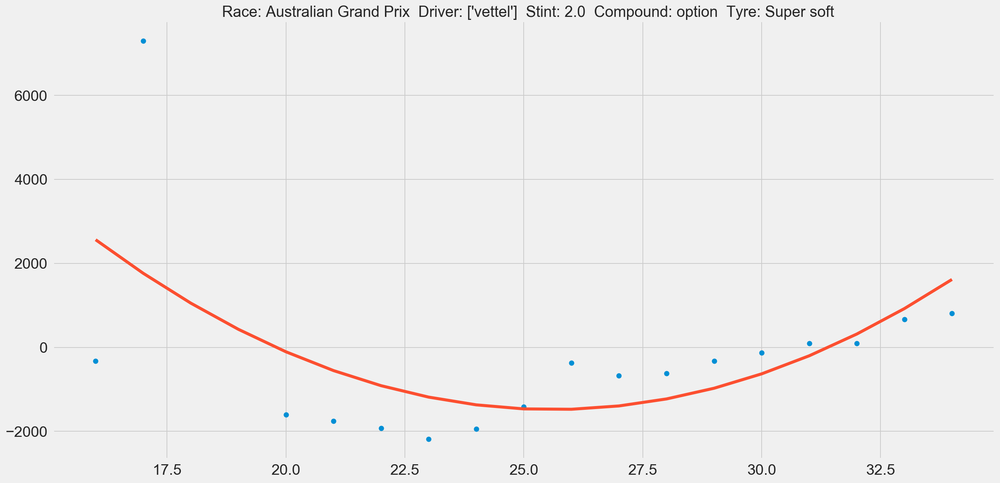

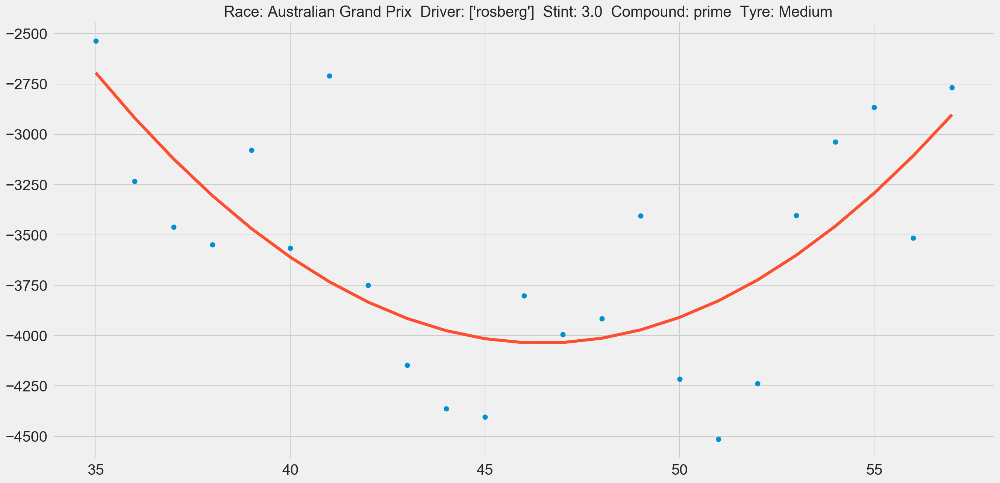

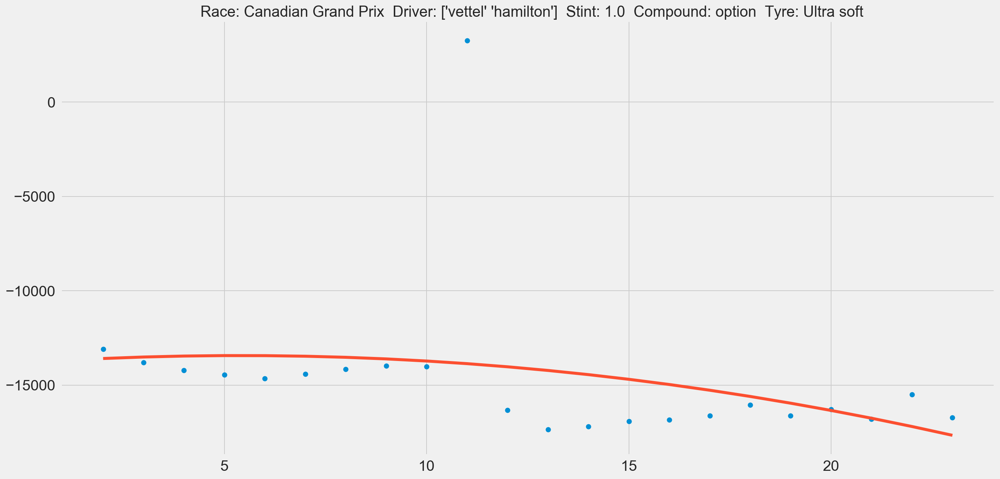

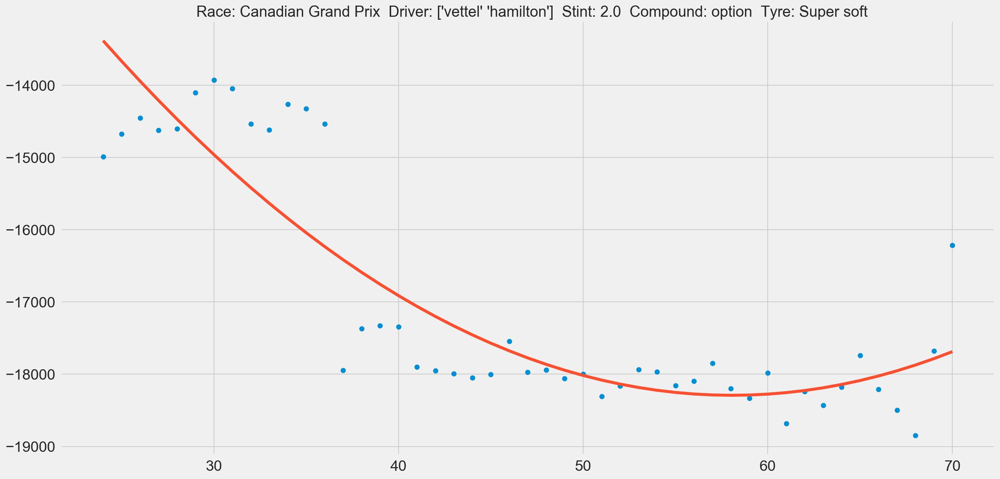

...

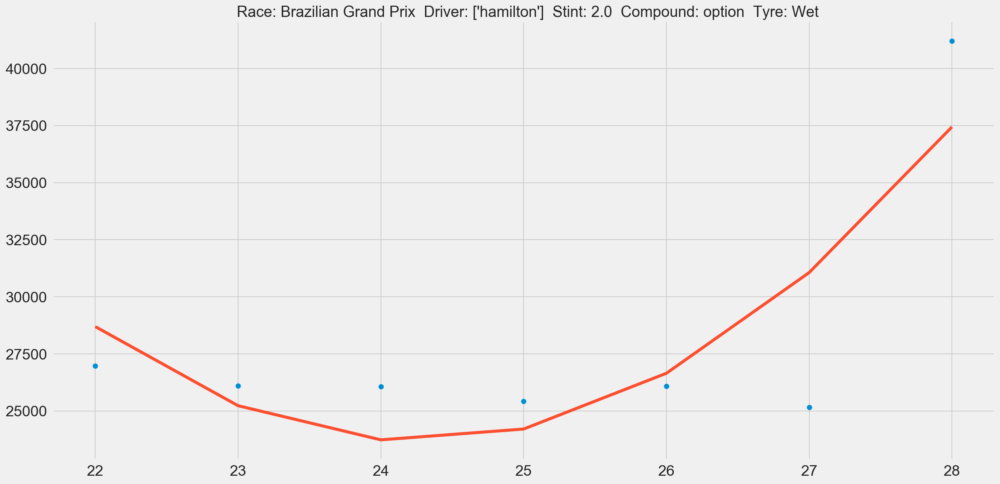

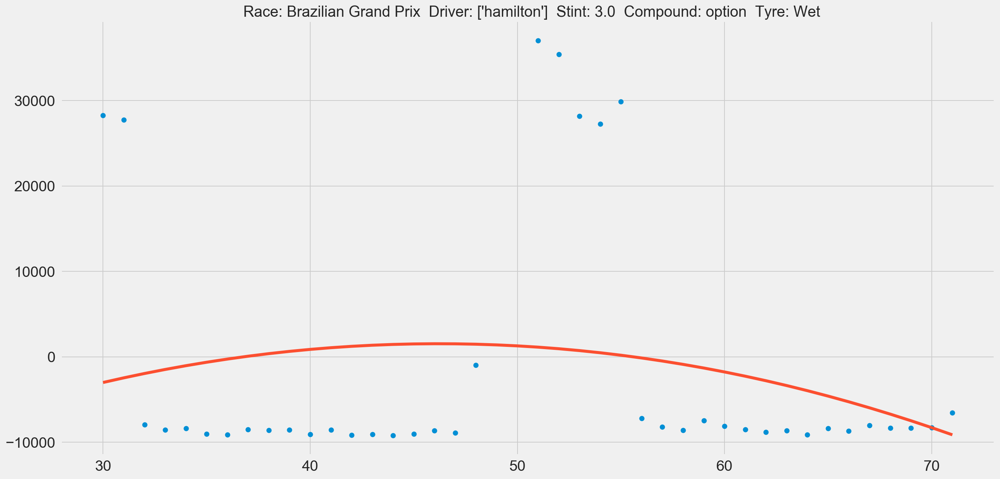

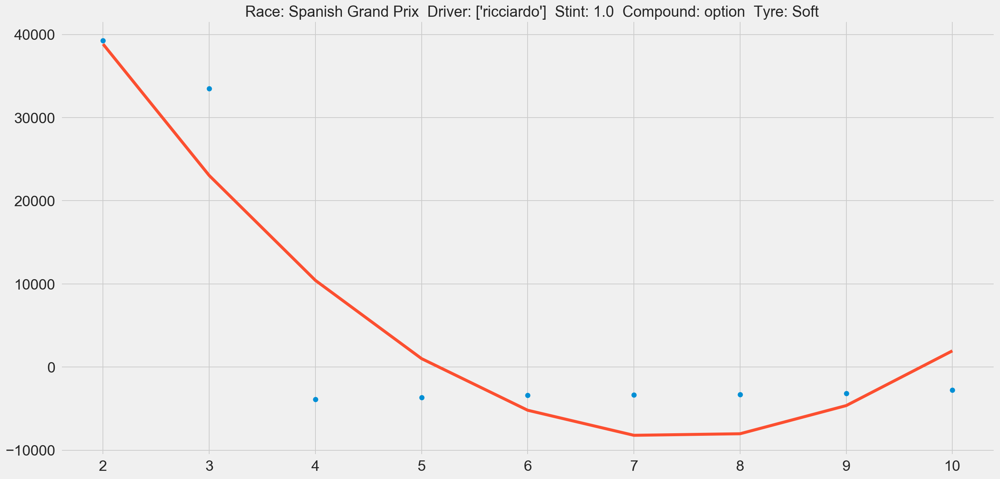

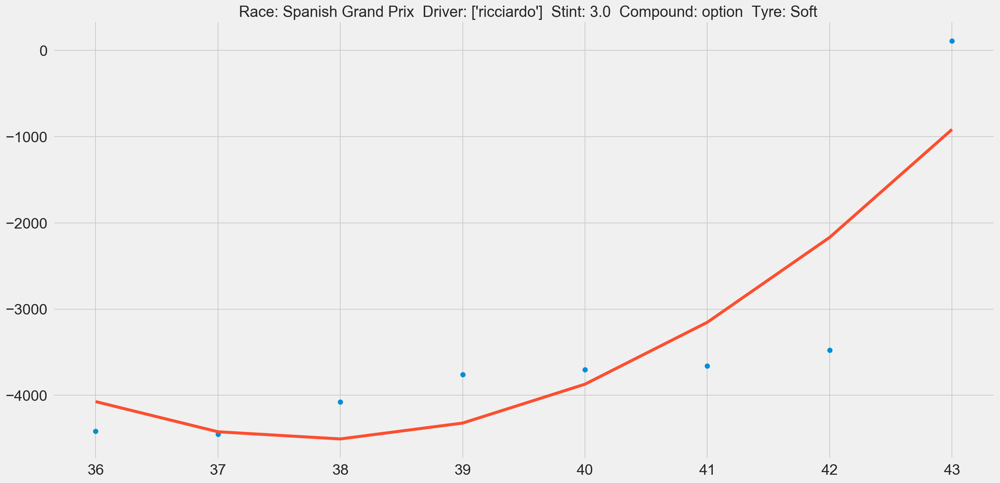

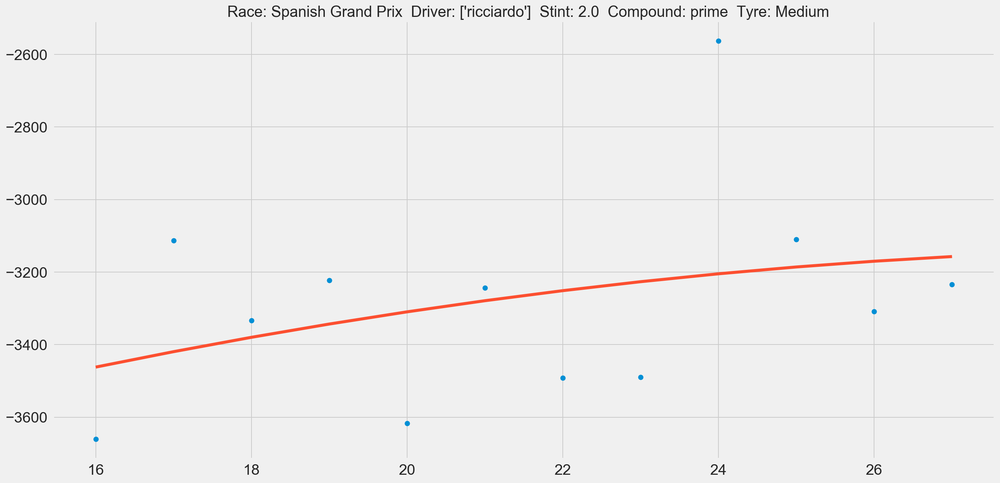

In [415]:
# Note: Some plots are not accurate because there are stints from more than one driver plotted 
df_2016_TDPS = tyre_degradation_per_stint(tyres, ['2016'], "", "", "", "", center=True, minimum=5)
models = indiv_polynomial_reg_POLYFIT(df_2016_TDPS, groupby_1_field="name", groupby_2_field="compound", groupby_3_field="stint", centered=True, show_plot=True, show_table = False)
models

In [418]:
tyre_degradation_table_race = indiv_polynomial_reg_POLYFIT(df_2016_TDPS, groupby_1_field="name", groupby_2_field="compound", groupby_3_field="stint", centered=False, show_plot=False, show_table = True)
tyre_degradation_table_race[tyre_degradation_table_race['name'] == "Malaysian Grand Prix"]

,coeffs,compound,name,stint
120,"[36.7230576441, -1466.19323308]",option,Malaysian Grand Prix,1.0
121,No group,option,Malaysian Grand Prix,2.0
122,"[60.1923076923, -5999.33076923]",option,Malaysian Grand Prix,3.0
123,No group,option,Malaysian Grand Prix,4.0
124,No group,prime,Malaysian Grand Prix,1.0
125,No group,prime,Malaysian Grand Prix,2.0
126,No group,prime,Malaysian Grand Prix,3.0
127,No group,prime,Malaysian Grand Prix,4.0


In [417]:
tyre_degradation_table_driver = indiv_polynomial_reg_POLYFIT(df_2016_TDPS, groupby_1_field="driverRef", groupby_2_field="compound", groupby_3_field="stint", centered=True, show_plot=False, show_table = True)
tyre_degradation_table_driver

,coeffs,compound,driverRef,stint
0,"[-5.37554267019, 125.033668176]",option,vettel,1.0
1,"[105.764181745, -5452.32752235]",option,vettel,2.0
2,No group,option,vettel,3.0
3,No group,option,vettel,4.0
4,No group,prime,vettel,1.0
5,"[331.071428572, -20590.0714286]",prime,vettel,2.0
6,No group,prime,vettel,3.0
7,No group,prime,vettel,4.0
8,"[-17.8021162945, 64.6306722831]",option,rosberg,1.0
9,"[-8.13688560186, -267.669966737]",option,rosberg,2.0


In [ ]:
# Pickle tyre degradation table dataframe
tyre_degradation_table_driver.to_pickle(os.path.join(directory, "tyre_degradation_table_driver.pickle"))
tyre_degradation_table_race.to_pickle(os.path.join(directory, "tyre_degradation_table_race.pickle"))

## Test the model

### Comparison of drivers and races between 2015, 2016 and 2017 season

In [123]:
all_2015_2016_races = filter_laptimes(["2015", "2016"], "", "")
all_2017_races = filter_laptimes(["2017"], "", "")

drivers_2015_2016 = all_2015_2016_races.driverRef.unique()
drivers_2017 = all_2017_races.driverRef.unique()

races_2015_2016 = all_2015_2016_races.name.unique()
races_2017 = all_2017_races.name.unique()

In [124]:
# These drivers are no longer participating in F1 in 2017, I will not create training sets for them.
drivers_2017_dropped = np.setdiff1d(drivers_2015_2016, drivers_2017)
drivers_2017_dropped

array(['gutierrez', 'haryanto', 'maldonado', 'merhi', 'nasr', 'rosberg',
       'rossi', 'stevens'], dtype=object)

In [125]:
# These drivers were dropped from their teams before the full season ended. 
# I will create train-test sets for the races they completed in 2017
# Kvyat, Palmer

In [126]:
# These drivers are new to F1 in 2017, I do not have training sets for them.
drivers_2017_rookies = list(np.setdiff1d(drivers_2017, drivers_2015_2016))
drivers_2017_rookies

['brendon_hartley', 'gasly', 'giovinazzi', 'resta', 'stroll']

In [128]:
# In addition, some drivers debuted in F1 in 2016, but never ran a full season, I do not have full training sets for them
# Stoffel Vandoorne: Only did the Australian Grand Prix in 2016, full season in 2017
# Esteban Ocon: Replaced Haryanto in the second half of 2016. Full season in 2017.
drivers_2017_rookies.append('vandoorne')
drivers_2017_rookies.append('ocon')

In [129]:
# There is no German Grand Prix in 2017, so I will not create train set for it
# 2016 European Grand Prix was held in Azerbaijan. It was renamed to Azerbaijan Grand Prix from 2017 onwards.
# I will rename the 2016 European Grand Prix as 2016 Azerbaijan Grand Prix.
races_dropped_2017 = np.setdiff1d(races_2015_2016, races_2017)
races_dropped_2017 

array(['European Grand Prix', 'German Grand Prix'], dtype=object)

### MODEL

In [374]:
# Create dataframe template to fill with each driver's individual model

def create_model(data, tyre_degradation_table, tyre_degrad_multiplier, df_race_pace, df_laptime_var):
    
    driver = drivers_2015_2016
    name = races_2015_2016
    compound = data["compound"].unique()
    tyre = data["tyre"].unique()
    stint = data['stint'].unique()
    columns_header = ['driverRef', 'name', 'compound', 'stint']
    
    # Create dataframe template to fill with each driver's individual model
    template = pd.DataFrame(list(itertools.product(driver, name, compound, stint)), columns=columns_header)
    
    # Merge polynomial coeffs
    template = pd.merge(template, tyre_degradation_table, on=['name', 'compound', 'stint'], how='left')

    # Merge each driver's individual tyre degradation multiplier to the template
    template = pd.merge(template, tyre_degrad_multiplier, on=['driverRef', 'compound'], how='left')
    
    # Merge forecasted race pace
    template = pd.merge(template, df_race_pace, on=['driverRef'], how='left')
    
    # Merge laptime variability
    template = pd.merge(template, df_laptime_var, on=['driverRef'], how='left')
    
    return template

In [419]:
driver_models = create_model(df_2016_TDPS, tyre_degradation_table_race, df_driver_cpd, df_race_pace, laptime_var)
driver_models

,driverRef,name,compound,stint,coeffs,mean,ratio,est race pace,raceId,std,normalized score
0,rosberg,Australian Grand Prix,option,1.0,"[6.99766899767, 13.7417249417]",20.355324,NaN,95215.946237,948.0,774.569444,0.213567
1,rosberg,Australian Grand Prix,option,2.0,"[43.8725003161, -2246.15439371]",20.355324,NaN,95215.946237,948.0,774.569444,0.213567
2,rosberg,Australian Grand Prix,option,3.0,No group,20.355324,NaN,95215.946237,948.0,774.569444,0.213567
3,rosberg,Australian Grand Prix,option,4.0,No group,20.355324,NaN,95215.946237,948.0,774.569444,0.213567
4,rosberg,Australian Grand Prix,prime,1.0,No group,23.350000,NaN,95215.946237,948.0,774.569444,0.213567
5,rosberg,Australian Grand Prix,prime,2.0,No group,23.350000,NaN,95215.946237,948.0,774.569444,0.213567
6,rosberg,Australian Grand Prix,prime,3.0,"[10.2169113495, -949.403472614]",23.350000,NaN,95215.946237,948.0,774.569444,0.213567
7,rosberg,Australian Grand Prix,prime,4.0,No group,23.350000,NaN,95215.946237,948.0,774.569444,0.213567
8,rosberg,Malaysian Grand Prix,option,1.0,"[36.7230576441, -1466.19323308]",20.355324,NaN,95215.946237,948.0,774.569444,0.213567
9,rosberg,Malaysian Grand Prix,option,2.0,No group,20.355324,NaN,95215.946237,948.0,774.569444,0.213567


In [393]:
tyre_degradation_table_race[tyre_degradation_table_race['name'] == "Malaysian Grand Prix"]

,coeffs,compound,name,stint
144,No group,option,Malaysian Grand Prix,1.0
145,No group,option,Malaysian Grand Prix,2.0
146,"[60.1923076923, -5999.33076923]",option,Malaysian Grand Prix,3.0
147,No group,option,Malaysian Grand Prix,4.0
148,No group,prime,Malaysian Grand Prix,1.0
149,No group,prime,Malaysian Grand Prix,2.0
150,No group,prime,Malaysian Grand Prix,3.0
151,No group,prime,Malaysian Grand Prix,4.0


In [434]:
race_models = pd.merge(tyre_degradation_table_race, df_name_cpd, on=['name', 'compound', 'stint'], how='left')
race_models

,coeffs,compound,name,stint,mean,ratio,total laps,ratio: stint/total laps
0,"[6.99766899767, 13.7417249417]",option,Australian Grand Prix,1,15.384921,0.903978,57.0,0.269911
1,"[43.8725003161, -2246.15439371]",option,Australian Grand Prix,2,22.842105,1.840171,57.0,0.400739
2,No group,option,Australian Grand Prix,3,14.000000,1.161027,57.0,0.245614
3,No group,option,Australian Grand Prix,4,15.000000,0.971096,57.0,0.263158
4,No group,prime,Australian Grand Prix,1,NaN,NaN,NaN,NaN
5,No group,prime,Australian Grand Prix,2,40.400000,1.485313,57.0,0.708772
6,"[10.2169113495, -949.403472614]",prime,Australian Grand Prix,3,35.666667,2.596423,57.0,0.625731
7,No group,prime,Australian Grand Prix,4,25.000000,1.065947,57.0,0.438596
8,"[-21.0449604743, 510.411984754]",option,Canadian Grand Prix,1,23.527778,NaN,70.0,0.336111
9,"[0.953907788832, -114.379057405]",option,Canadian Grand Prix,2,34.616667,NaN,70.0,0.494524


In [136]:
def make_sets(year, race_name, driver_name, no_outliers=True):
    
    data = filter_laptimes(year, race_name, driver_name)
    
    if no_outliers == True:
        data = filter_outliers_percentile(data)
    
    tyres_use = tyre_use_race(tyres, year , race_name, driver_name)
    data_tyres = tyre_use_race_laptimes(data, tyres_use)
    pitlaps = filter_pitlaps(year, race_name, driver_name, df_pitStops = df_pitStops)
    master_set = master_table(data_tyres, pitlaps, df_overtaking_preprocessed)
    
    return master_set

### Create train set

In [137]:
master_train_set = make_sets(['2015', '2016'], "", "", no_outliers=True)
master_test_set = make_sets(['2017'], "", "", no_outliers=True)

drivers_train = set(master_train_set.driverRef.unique()) - set(drivers_2017_dropped)

for i, row in master_train_set.iterrows():
    if (row['name'] == 'European Grand Prix') & (row['year'] == 2016):
        master_train_set.loc[i, 'name']= "Azerbaijan Grand Prix"
        
races_train = set(master_train_set.name.unique())   

stints = [1, 2, 3, 4]

### Fit model on train set and make predictions

In [389]:
# DRIVER

def make_prediction_DRIVER(data, races_train, drivers_train):
    
    all_results = pd.DataFrame()
    no_results = pd.DataFrame()
    total_time = []
    driver_names = []
    race_names = []
    
    for race_name, driver in itertools.product(races_train, drivers_train):
        try:
            train_grouped = driver_models_new.groupby(['name', 'driverRef']).get_group((race_name, driver)).reset_index()
            train_prime = train_grouped[train_grouped['compound'] == "prime"].reset_index(drop=True)
            train_option = train_grouped[train_grouped['compound'] == "option"].reset_index(drop=True)

            total_laps = df_races_maxlaps[(df_races_maxlaps['name'] == race_name) & (df_races_maxlaps['year'] == 2016)]['total laps'].values[0]
            stint1 = driver_models_new[(driver_models_new['name'] == race_name) & (driver_models_new['compound'] == "prime")]['mean'].values[0]
            stint2 = total_laps - stint1

            ### INPUT MODEL HERE: Create lap time model for each driver per race track ###
            prime_laptimes = [train_prime['coeffs'][0](x) for x in range(1, int(stint1))]
            option_laptimes = [train_option['coeffs'][0](x) for x in range(1, int(stint2))]
            total = sum(i for i in prime_laptimes) + sum(i for i in option_laptimes)
            ######

            race_names.append(race_name)
            driver_names.append(driver)
            total_time.append(total)
            
        except:
            comment = "DNS or DNF a lap"
            race_names.append(race_name)
            driver_names.append(driver)
            total_time.append(comment)
    
    model = pd.DataFrame(
                            { "race name": race_names,
                              "driver name": driver_names,
                              'stint time': total_time,
                            }
                        )
    
    return model


In [420]:
driver_models_new = driver_models[driver_models['coeffs'] != "No group"].reset_index(drop=True)
driver_models_new

,driverRef,name,compound,stint,coeffs,mean,ratio,est race pace,raceId,std,normalized score
0,rosberg,Australian Grand Prix,option,1.0,"[6.99766899767, 13.7417249417]",20.355324,NaN,95215.946237,948.0,774.569444,0.213567
1,rosberg,Australian Grand Prix,option,2.0,"[43.8725003161, -2246.15439371]",20.355324,NaN,95215.946237,948.0,774.569444,0.213567
2,rosberg,Australian Grand Prix,prime,3.0,"[10.2169113495, -949.403472614]",23.350000,NaN,95215.946237,948.0,774.569444,0.213567
3,rosberg,Malaysian Grand Prix,option,1.0,"[36.7230576441, -1466.19323308]",20.355324,NaN,95215.946237,948.0,774.569444,0.213567
4,rosberg,Malaysian Grand Prix,option,3.0,"[60.1923076923, -5999.33076923]",20.355324,NaN,95215.946237,948.0,774.569444,0.213567
5,rosberg,Chinese Grand Prix,option,1.0,"[58.9883908852, -1423.26864267]",20.355324,NaN,95215.946237,948.0,774.569444,0.213567
6,rosberg,Chinese Grand Prix,option,2.0,"[162.573179272, -9460.20651261]",20.355324,NaN,95215.946237,948.0,774.569444,0.213567
7,rosberg,Chinese Grand Prix,prime,3.0,"[60.7529619503, -5922.14651401]",23.350000,NaN,95215.946237,948.0,774.569444,0.213567
8,rosberg,Bahrain Grand Prix,option,1.0,"[72.3121878122, -832.696803197]",20.355324,NaN,95215.946237,948.0,774.569444,0.213567
9,rosberg,Bahrain Grand Prix,option,2.0,"[136.205495356, -6293.45110939]",20.355324,NaN,95215.946237,948.0,774.569444,0.213567


In [421]:
test= make_prediction_DRIVER(driver_models_new, races_train, drivers_train)
test

,driver name,race name,stint time
0,hulkenberg,Malaysian Grand Prix,DNS or DNF a lap
1,ocon,Malaysian Grand Prix,DNS or DNF a lap
2,alonso,Malaysian Grand Prix,DNS or DNF a lap
3,vettel,Malaysian Grand Prix,DNS or DNF a lap
4,bottas,Malaysian Grand Prix,DNS or DNF a lap
5,raikkonen,Malaysian Grand Prix,DNS or DNF a lap
6,kvyat,Malaysian Grand Prix,DNS or DNF a lap
7,hamilton,Malaysian Grand Prix,DNS or DNF a lap
8,grosjean,Malaysian Grand Prix,DNS or DNF a lap
9,massa,Malaysian Grand Prix,DNS or DNF a lap


In [388]:
train_grouped = driver_models_new.groupby(['driverRef', 'name']).get_group(("vettel", "United States Grand Prix")).reset_index()
train_prime = train_grouped[train_grouped['compound'] == "prime"].reset_index(drop=True)
train_option = train_grouped[train_grouped['compound'] == "option"].reset_index(drop=True)

total_laps = df_races_maxlaps[(df_races_maxlaps['name'] == "Australian Grand Prix") & (df_races_maxlaps['year'] == 2016)]['total laps'].values[0]
stint1 = driver_models_new[(driver_models_new['name'] == "Australian Grand Prix") & (driver_models_new['compound'] == "prime")]['mean'].values[0]
stint2 = total_laps - stint1

### INPUT MODEL HERE: Create lap time model for each driver per race track ###
prime_laptimes = [train_prime['coeffs'][0](x) for x in range(1, int(stint1))]
option_laptimes = [train_option['coeffs'][0](x) for x in range(1, int(stint2))]
total = sum(i for i in prime_laptimes) + sum(i for i in option_laptimes)
print stint1, total

23.35 6202340.10649


In [437]:
# STINT

def make_prediction_stint(data, races_train):
    
    all_results = pd.DataFrame()
    no_results = pd.DataFrame()
    total_time = []
    race_names = []
    
    for race_name in races_train:

        try:
            train_grouped = data.groupby('name').get_group(race_name).reset_index(drop=True)
            train_prime = train_grouped[train_grouped['compound'] == "option"].reset_index(drop=True)
            train_option = train_grouped[train_grouped['compound'] == "option"].reset_index(drop=True)
            
            total_laps = df_races_maxlaps[(df_races_maxlaps['name'] == race_name) & (df_races_maxlaps['year'] == 2016)]['total laps'].values[0]
            #stint_laps = data[(data['name'] == race_name) & (data['stint'] == stint)]['mean'].values[0]
            stint1 = pitlaps_trend[(pitlaps_trend['name'] == race_name) & (pitlaps_trend['year'] == 2016)]['mode']
            stint2 = total_laps - stint1
            
            ### INPUT MODEL HERE: Create lap time model for each driver per race track ###
            prime_laptimes = [train_prime['coeffs'][0](x) for x in range(1, int(stint1))]
            option_laptimes = [train_option['coeffs'][0](x) for x in range(1, int(stint2))]
            total = sum(i for i in prime_laptimes) + sum(i for i in option_laptimes)
            ######

            race_names.append(race_name)
            total_time.append(total)
            
        except:
            comment = "DNS or DNF a lap"
            race_names.append(race_name)
            total_time.append(comment)
    
            
    model = pd.DataFrame(
                            { "race name": race_names,
                              'stint time': total_time,
                            }
                        )
    
    return model


In [422]:
driver_models_new[driver_models_new['name'] == "Malaysian Grand Prix"]

,driverRef,name,compound,stint,coeffs,mean,ratio,est race pace,raceId,std,normalized score
3,rosberg,Malaysian Grand Prix,option,1.0,"[36.7230576441, -1466.19323308]",20.355324,NaN,95215.946237,948.0,774.569444,0.213567
4,rosberg,Malaysian Grand Prix,option,3.0,"[60.1923076923, -5999.33076923]",20.355324,NaN,95215.946237,948.0,774.569444,0.213567
70,hamilton,Malaysian Grand Prix,option,1.0,"[36.7230576441, -1466.19323308]",21.792222,1.221136,94826.827160,948.0,1129.597752,0.628955
71,hamilton,Malaysian Grand Prix,option,3.0,"[60.1923076923, -5999.33076923]",21.792222,1.221136,94826.827160,948.0,1129.597752,0.628955
137,sainz,Malaysian Grand Prix,option,1.0,"[36.7230576441, -1466.19323308]",NaN,NaN,87239.187500,948.0,999.925648,0.477237
138,sainz,Malaysian Grand Prix,option,3.0,"[60.1923076923, -5999.33076923]",NaN,NaN,87239.187500,948.0,999.925648,0.477237
204,massa,Malaysian Grand Prix,option,1.0,"[36.7230576441, -1466.19323308]",14.954718,0.775697,93277.757576,948.0,714.126234,0.142848
205,massa,Malaysian Grand Prix,option,3.0,"[60.1923076923, -5999.33076923]",14.954718,0.775697,93277.757576,948.0,714.126234,0.142848
271,vettel,Malaysian Grand Prix,option,1.0,"[36.7230576441, -1466.19323308]",17.380079,NaN,92131.022727,948.0,1243.067109,0.761716
272,vettel,Malaysian Grand Prix,option,3.0,"[60.1923076923, -5999.33076923]",17.380079,NaN,92131.022727,948.0,1243.067109,0.761716


In [ ]:
# RACE
def make_prediction_RACE(data, races_train, stints, pit_strategy):
    all_stints = pd.DataFrame()
    for tyre in pit_strategy:
        stint_result = make_prediction_stint(data, races_train, stints, tyre)
        all_stints = pd.concat([all_stints, stint_result], axis=1)
        #try:
            #all_stints['total race time'] = all_stints['stint time'].sum()
    return all_stints

In [438]:
make_prediction_stint(race_models, races_train)

,race name,stint time
0,Malaysian Grand Prix,5.87339e+06
1,Chinese Grand Prix,6.74978e+06
2,Abu Dhabi Grand Prix,6.0442e+06
3,United States Grand Prix,5.69519e+06
4,Brazilian Grand Prix,1.5442e+07
5,Russian Grand Prix,5.77272e+06
6,British Grand Prix,DNS or DNF a lap
7,Mexican Grand Prix,7.15607e+06
8,Italian Grand Prix,4.54326e+06
9,Bahrain Grand Prix,5.89159e+06


In [ ]:
train_grouped = tyre_degradation_table_race.groupby(['name', 'stint']).get_group(("Singapore Grand Prix", 1)).reset_index()
train_grouped = train_grouped[train_grouped['compound'] == "option"]
total_laps = df_races_maxlaps[(df_races_maxlaps['name'] == "Singapore Grand Prix") & (df_races_maxlaps['year'] == 2016)]['total laps'].values[0]
laptimes = [train_grouped['coeffs'][0](x) for x in range(1,total_laps)]
total = sum(i for i in laptimes)
print type(train_grouped['coeffs'][0])

## EVALUATION PREDICTIONS

In [ ]:
def evaluate_predictions(df):
    
    #Sort predicted race time in ascending order and provide a ranking
    df = df.groupby(['name']).apply(lambda x: x.sort_values('predicted race time', ascending=True)).reset_index(drop=True)
    df['predicted rank'] = df.groupby(['name'])['predicted race time'].rank(ascending=True)

    # Merge results (position standings) to prediction results dataframe
    df_racename = pd.merge(df, df_races[['raceId', 'year', 'name']], on=['name', 'year'], how='left')
    df_new = pd.merge(df_racename, df_drivers[['driverId', 'driverRef']], on='driverRef', how='left')
    results = pd.merge(df_new, df_results[['raceId', 'driverId', 'position', 'points', 'milliseconds']], on=['raceId', 'driverId'], how='left')
    
    # Compare the predicted results vs actual results
    results['rank diff'] = results['predicted rank'] - results['position']
    for i,row in results.iterrows():
        if type(results.loc[i,'predicted race time']) != str:
            results.loc[i,'time diff'] = results.loc[i,'predicted race time'] - results.loc[i, 'milliseconds'] 
        else:
            results.loc[i, 'time diff'] = "no results"

    # Format results table 
    results = results[['driverId', 'driverRef', 'raceId', 'name', 'year', 'points', 'position', 'milliseconds', 'predicted rank', 'predicted race time', 'time diff', 'rank diff']]
                                                              
    return results

In [ ]:
results = evaluate_predictions(predictions)
results

### Visualize predicted results

In [ ]:
def plot_ranking_comparision(df, races_train):
    
    for race in races_train:
        grouped = df.groupby('name').get_group(race).reset_index()
        fig, ax = plt.subplots()
        # predicted
        sns.barplot(x="driverRef", y="predicted rank", data=grouped, ax=ax, color="seagreen")
        # actual
        sns.barplot(x="driverRef", y="position", data=grouped, ax=ax, color="coral", alpha=0.5)
        ax = plt.gca()
        ax.set_title(race)

In [ ]:
plot_ranking_comparision(results, races_train)

### Issues
#### 1) Races where drivers DNS or did not complete first lap are not in train set

#### 2) 2017 drivers with none nor no full training sets

#### 3) Drivers who did not finish a particular race have poor models built

#### 4) Have separate models for street and normal ciruits

In [ ]:
def rescue_code(function):
    import inspect
    get_ipython().set_next_input("".join(inspect.getsourcelines(function)[0]))

In [ ]:
rescue_code(f)